# Effective Pandas

# Intro:
pandas is an in-memory analysis tool, which has SQL-like constructs, essential statistical and analytic support, as well as graphing capability

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')
sns.color_palette("hls", 15)

import pandas as pd
print(f"version:: {pd.__version__}")

version:: 2.3.3


# Data Structure
At the core of pandas are two data structures. `Series` and `Dataframe`

| Data Structure | Dimensionality | Spreadsheet Analog | Database Analog | Linear Algebra |
|----------------|----------------|--------------------|-----------------|----------------|
| Series         |   1D           | Column             | Column          | Column vector  |
| Dataframe      |   2D           | Single Sheet       | Table           | Matrix         |

# Series

## Index Abstraction

In [2]:
# In Python, 
series:dict = {
    'index':[0,1,2,3],
    'data':[145,142,38,13],
    'name':'songs'
}
print(series)

def get(series:dict,idx:int)->int:
    value_idx = series['index'].index(idx)
    return series['data'][value_idx]

print(get(series=series,idx=1))
print(get(series=series,idx=3))



# Another example, bit different
songs:dict = {
    'index':['Paul',"John",'Muthu',"Laksh"],
    'data':[145,142,38,13],
    'name':'counts'
}
print(songs)

print(get(songs,idx='Muthu'))

# This dobule Astraction of the index seems unnecessary but trick up pandas's sleeves. By allowing non-int values like dates,string.

{'index': [0, 1, 2, 3], 'data': [145, 142, 38, 13], 'name': 'songs'}
142
13
{'index': ['Paul', 'John', 'Muthu', 'Laksh'], 'data': [145, 142, 38, 13], 'name': 'counts'}
38


## pandas Series
![Series](./assets/pandas%20series%20img.png)

Even though this looks two-dimensional, remember that the index is not part of the
values

To get the best speed (and to leverage vectorized operations), the `Values` should be of the same type, though this is not required

In [3]:
songs2 = pd.Series([145,142,38,13],name='counts')
print(songs2)
print(f"index:: {songs2.index}")

0    145
1    142
2     38
3     13
Name: counts, dtype: int64
index:: RangeIndex(start=0, stop=4, step=1)


## The NaN values

- stands for `Not A Number` similar to NULL in SQL
- `None`, `NaN`, `nan`,`<NA>`, and `null` are synonyms in this book when referring to empty or missing data
found in a pandas series or dataframe.

In [4]:
nan_series = pd.Series([2,np.nan],index=["Ono",'Clapton'])
print(nan_series)
# Not type is float64 not int64. internally it coerced values to float value

print(f"count function :: {nan_series.count()}")  # Ignoring NaN values
print(f"size property  :: {nan_series.size}")     # Includes missing value

Ono        2.0
Clapton    NaN
dtype: float64
count function :: 1
size property  :: 2


## Optional Integer Support for NaN

In [5]:
nan_series2 = pd.Series([2,None],index=['Ono','Claption'],dtype='Int64')
print(nan_series2)


print(f"count function :: {nan_series2.count()}")  # Ignoring NaN values
print(f"size property  :: {nan_series2.size}")     # Includes missing value

Ono            2
Claption    <NA>
dtype: Int64
count function :: 1
size property  :: 2


## Similar to Numpy
- Index operations


![FIltering with boolean Array](./assets/filteting%20in%20pandas.png)

In [6]:
numpy_ser = np.array([145 , 142 , 38 , 13])
print(f"numpy series index 1 :: {numpy_ser[1]}")
print(f"numpy mean :: {numpy_ser.mean()}")


songs3 = pd.Series(index=['Paul',"John","George","Ringo"],data=[145,142,38,13])
print(f"median of songs :: {songs3.median()}")
mask = songs3 > songs3.median()
print(f"mask::\n{mask}")
print(f"modified songs::\n{songs3[mask]}")

numpy series index 1 :: 142
numpy mean :: 84.5
median of songs :: 90.0
mask::
Paul       True
John       True
George    False
Ringo     False
dtype: bool
modified songs::
Paul    145
John    142
dtype: int64


## Categorical  Data

- If our data is limited to few values, we might want to use categorical data. 
- Benefits:
    -   Use less memory than string
    -   Improve performance
    -   can have an Ordering
    -   can perform operation on categories
    -   Enforce membership on values
- category not limited to string. we can convert numbers or datetime values to category
- `.astype("catgory")` or `dtype='category'`
- `pd.api.types.CategoricalDtype`



| Method | Description |
|--------|-------------|
|pd.Series(data=None, index=None,dtype=None, name=None, copy=False) |  Create a series from data (sequence, dictionary, or scalar).|
| s.index | Access index of series. |
| s.astype(dtype, errors='raise') | Cast a series to dtype. To ignore errors (and return original object) use errors='ignore'.|
| s[boolean_array] | Return values from s where boolean_array is True.
| s.cat.ordered | Determine if a categorical series is ordered.|
| s.cat.reorder_categories( new_categories, ordered=False) |Add categories (potentially ordered) to the series new_categories must include all categories.|

In [7]:
s = pd.Series(['m','l','xs','s','xl'],dtype='category')
print(f"s::\n{s}")

# In nature there is a ordering like small, medium, ... extra-large
print(f"is it ordered:: {s.cat.ordered}")

# To convert into ordered
s2 = pd.Series(data=['m','l','xs','s','xl'])
size_type = pd.api.types.CategoricalDtype(categories=['s','m','l'],ordered=True)
print(f"ordered size_type:: {size_type}")

s3 = s2.astype(size_type)
print(s3)                       # getting NaN because we limited to few sizes
print(f"is it s3 ordered:: {s3.cat.ordered}")


print(f"filtering s3::\n{s3[s3>'s']}")


# Other way,
s = s.cat.reorder_categories(['xs','s','m','l','xl'],ordered=True)
print(f"s::\n{s}")
print(f"is it ordered:: {s.cat.ordered}")

s::
0     m
1     l
2    xs
3     s
4    xl
dtype: category
Categories (5, object): ['l', 'm', 's', 'xl', 'xs']
is it ordered:: False
ordered size_type:: category
0      m
1      l
2    NaN
3      s
4    NaN
dtype: category
Categories (3, object): ['s' < 'm' < 'l']
is it s3 ordered:: True
filtering s3::
0    m
1    l
dtype: category
Categories (3, object): ['s' < 'm' < 'l']
s::
0     m
1     l
2    xs
3     s
4    xl
dtype: category
Categories (5, object): ['xs' < 's' < 'm' < 'l' < 'xl']
is it ordered:: True


In [8]:
colors = pd.Series(['red','blue','green','violet','orange'],dtype='category')
print(f"colors::\n{colors}")

colors::
0       red
1      blue
2     green
3    violet
4    orange
dtype: category
Categories (5, object): ['blue', 'green', 'orange', 'red', 'violet']


# Series Deep Dive

there were many operations you can do with a Series

## Loading the Data

If zip file has only one csv,we can directly read `.read_csv`. Whereas multiple files, we would need to decompress the data to pull out the file we are interested in.

In [9]:
df:pd.DataFrame    = pd.read_csv("./assets/vehicles.csv.zip",compression='zip')
city_mpg:pd.Series = df.city08
highway_mpg:pd.Series = df.highway08

/tmp/ipykernel_6337/3884064152.py:1: DtypeWarning: Columns (68,70,71,72,73,74,76,79) have mixed types. Specify dtype option on import or set low_memory=False.
  df:pd.DataFrame    = pd.read_csv("./assets/vehicles.csv.zip",compression='zip')


## Series Attributes

There are many ways to categorize these, and I’m roughly going to do it by what the result of the method is:
-   Dunder methods (.__add__,.__iter__,etc) provide many numeric operation, looping, attribute access and index access. For numeric operations, these return Series
-   Corresponding operator methods for many of the numeric operations allow us to tweak the behaviout (.add method in addition to .__add__)
-   Aggregate methods and Properties which reduce or aggregate the values in a series down to single scler value like (.mean, .max, .sum, .is_monotonic property)
-   conversion methods. some of these start with .to_ and export the data to other format (parquet,sql,excel,csv,json..)
- manipulation methods. some of like (.sort_values, .drop_duplicates) returns Series with same index
-   Indexing and accessor methods and attributes like .loc and .iloc (Series or Scaler)
-   String manipulation methods using .str
-   Date   manipulation methods using .dt
-   Plotting methods  using .plot
-   Categorical manipaulation using   .cat
-   PLotting methods using .plot
-   Transformation methods such as .unstack, .reset_index, .agg, .transform
-   Attributes such as .index and .dtype
-   A bunch of private attributes that we will ignored.

In [10]:
print(f"how many functions associated with Series:: {len([ _ for _ in dir(pd.Series) if not _.startswith('_') ])}")

how many functions associated with Series:: 210


# Operators

## Intro
Will see some protocols that determine how the python language reacts to operations,

-   use the `+` operation, Python is dispatching to the `.__add__` method.
-   use a loop with a `for` statement, Python dispatches to the `.__iter__` method


## Dunder Methods

In [11]:
add_two_numbers  = 2+4
print(f"2+4 :: {add_two_numbers}")

add_two_numbers2 = (2).__add__(4)
print(f"(2).__add__(4) :: {add_two_numbers2}")

# Operation on Series
print(f"operation on series::\n{(city_mpg + highway_mpg)/2}")

2+4 :: 6
(2).__add__(4) :: 6
operation on series::
0        22.0
1        11.5
2        28.0
3        11.0
4        20.0
         ... 
41139    22.5
41140    24.0
41141    21.0
41142    21.0
41143    18.5
Length: 41144, dtype: float64


## Index Alignment

While doing operations, pandas check index alignment. make sure that the indexes:
-   Are unique (no duplicates)
-   Are common to both serie

![Duplicate index Alignment](./assets/duplicate%20index%20alignment.png)

In [12]:
s1:pd.Series = pd.Series([10,20,30],index=[1,2,2]) 
s2:pd.Series = pd.Series([35,44,53],index=[2,2,4],name='s2')

print(f"s1::\n{s1}")
print(f"s2::\n{s2}")
print(f"s1+s2::\n{s1+s2}")

s1::
1    10
2    20
2    30
dtype: int64
s2::
2    35
2    44
4    53
Name: s2, dtype: int64
s1+s2::
1     NaN
2    55.0
2    64.0
2    65.0
2    74.0
4     NaN
dtype: float64


## Broadcasting

When we perform math operation with a scaler, pandas do broadcasts the operation to all values.

With many math operations, these are optimized and happen very quickly in the CPU. This is called vectorizationn. (A numeric pandas series is a block of memory, and modern CPUs leverage a technology called Single Instruction/Multiple Data (SIMD) to apply a math operation to the block of memory..

In [13]:
print(f"add scaler::\n{s1 + 20}")

add scaler::
1    30
2    40
2    50
dtype: int64


## Iteration

recommend avoiding using a for loop with a series, loose power of vectorization and operating at C level

## Operator Methods

In [14]:
# So Instead of + operator

print(f"add operator::\n{s1.add(s2)}")  # results Same
print(f"add operator add fill_value parameter::\n{s1.add(s2,fill_value=0)}")

add operator::
1     NaN
2    55.0
2    64.0
2    65.0
2    74.0
4     NaN
dtype: float64
add operator add fill_value parameter::
1    10.0
2    55.0
2    64.0
2    65.0
2    74.0
4    53.0
dtype: float64


## Chaining

prefer operator methods so that it makes `chaining` manipulation easier.

`Note`: most of pandas methods do not mutate data in-place but instead returns a new object


| Method     | Operator        | Description |
|------------|-----------------|-------------|
| s.add(s2)  | s + s2          | Adds series |
| s.radd(s2) | s2 + s          | Adds series |
| s.sub(s2)  | s - s2          | Subtracts series |
| s.rsub(s2) | s2 - s          | Subtracts series |
| s.mul(s2)  s.multiply(s2)   | s * s2  | Multiplies series |
| s.rmul(s2) | s2 * s | Multiplies series |
| s.div(s2) s.truediv(s2) | s / s2 | Divides series |
|s.rdiv(s2) s.rtruediv(s2)| s2 / s | Divides series|
|s.mod(s2)   | s % s2          | Modulo of series division|
|s.rmod(s2)  | s2 % s          | Modulo of series division|
|s.floordiv(s2) |  s // s2     | Floor divides series|
|s.rfloordiv(s2) | s2 // s     | Floor divides series|
|s.pow(s2)   | s ** s2         | Exponential power of series|
|s.rpow(s2)  | s2 ** s         | Exponential power of series|
|s.eq(s2)    | s2 == s         | Elementwise equals of series|
|s.ne(s2)    | s2 != s | Elementwise not equals of series|
|s.gt(s2) |s > 2| Elementwise greater than of series|
|s.ge(s2) |s >= 2| Elementwise greater than or equals of series|
|s.lt(s2) |s < 2| Elementwise less than of series|
|s.le(s2) |s <= 2 |Elementwise less than or equals of series|
|np.invert(s) |~s| Elementwise inversion of boolean series (no pandas method).|
|np.logical_and(s, s2) |s & s2 |Elementwise logical and of boolean series (no pandas method).|
|np.logical_or(s, s2) |s I s2| Elementwise logical or of boolean series (no pandas method)|

In [15]:
print(f"normal operation::\n{(city_mpg+highway_mpg)/2}")
print(f"chaining::\n{(city_mpg.add(highway_mpg)).div(2)}")

normal operation::
0        22.0
1        11.5
2        28.0
3        11.0
4        20.0
         ... 
41139    22.5
41140    24.0
41141    21.0
41142    21.0
41143    18.5
Length: 41144, dtype: float64
chaining::
0        22.0
1        11.5
2        28.0
3        11.0
4        20.0
         ... 
41139    22.5
41140    24.0
41141    21.0
41142    21.0
41143    18.5
Length: 41144, dtype: float64


# Aggregate Methods

Aggregate methods collapse the values of a series down to scaler. It allow you to take detailed data and collapse it to a single value.

## Aggregation

In [16]:
# example aggregation method
print(f"mean of city mpg ::{city_mpg.mean()}")

# Few aggregate properties.
print(f"is_unique ::{city_mpg.is_unique}")
print(f"is_  monotonic_increase ::{city_mpg.is_monotonic_increasing}")

mean of city mpg ::18.369045304297103
is_unique ::False
is_  monotonic_increase ::False


![Series Aggregation](./assets/series%20aggregation.png)
- aggregation returns scaler and series as well!

In [17]:
print(f".8 quantile :: {city_mpg.quantile(.8)}")
print(f"list of quantile [.1,.5,.8] ::\n{city_mpg.quantile(q=[.1,.5,.8])}")

.8 quantile :: 21.0
list of quantile [.1,.5,.8] ::
0.1    13.0
0.5    17.0
0.8    21.0
Name: city08, dtype: float64


## Count and Mean of an Attribute
trick for calc mean using chaining functions

Chaining is also called "flow" programming. Rather than making intermediate variables, just leverage the fact that most operations return a new object and work on that.

The chain should read like a recipe of ordered steps.

In [18]:
(
    city_mpg
    .gt(20)
    .multiply(100)
    .mean()
)

np.float64(24.965973167412017)

## .agg and Aggregation Strings

`.agg` methood does aggregation where it shines is in the ability to perform multiple aggregation. We can pass in the names of aggregation methods, Numpy reduction functions, Python aggregation, or define your own aggregation function.



| Method |  Description | 
|--------|--------------|
| 'all'  | Returns True if every value is truthy. |
| 'any'  | Returns True if any value is truthy. | 
| 'autocorr' |  Returns Pearson correlation of series with shifted self. Can override lag as keyword argument(default is 1).| 
| 'corr' | Returns Pearson correlation of series with other series. Need to specify other.  `pearson`,`spearman`, `kendall`, or a callable | 
| 'count'|  Returns count of non-missing values. | 
| 'cov' | Return covariance of series with other series. Need to specify other. | 
| 'dtype'|  Type of the series.| 
| 'dtypes'|  Type of the series. | 
| 'empty' | True if no values in series.| 
| 'hasnans'|  True if missing values in series| 
| 'idxmax' | Returns index value of maximum value. |
| 'idxmin' | Returns index value of minimum value. |
| 'is_monotonic' | True if values always increase. |
| 'is_monotonic_decreasing'|  True if values always decrease. |
| 'is_monotonic_increasing' | True if values always increase. |
| 'kurt' | Return ”excess” kurtosis (0 is normal distribution). Values greater than 0 have more outliers than normal. |
| 'mad' | Return the mean absolute deviation. |
| 'max' | Return the maximum value. |
| 'mean'| Return the mean value. |
|'median' | Return the median value. |
| 'min' | Return the minimum value. |
|'nbytes'| Return the number of bytes of the data. |
| 'ndim' | Return the number of dimensions (1) of the data. |
| 'nunique' | Return the count of unique values.|
| 'quantile' | Return the median value. Can override q to specify other quantile.|
| 'sem' | Return the unbiased standard error. |
| 'size'| Return the size of the data.|
|'skew'| Return the unbiased skew of the data. Negative indicates tail is on the left side. |
|'std'| Return the standard deviation of the data.|
|'sum' |Return the sum of the series.|

In [19]:
def second_to_last(s):
    return s.iloc[-2]

city_mpg.agg(['mean',np.min,np.var,max,second_to_last])

/tmp/ipykernel_6337/3362801592.py:4: FutureWarning: The provided callable <function min at 0x7f69e1debc40> is currently using Series.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  city_mpg.agg(['mean',np.min,np.var,max,second_to_last])
/tmp/ipykernel_6337/3362801592.py:4: FutureWarning: The provided callable <function var at 0x7f69e13047c0> is currently using Series.var. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "var" instead.
  city_mpg.agg(['mean',np.min,np.var,max,second_to_last])
/tmp/ipykernel_6337/3362801592.py:4: FutureWarning: The provided callable <built-in function max> is currently using Series.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  city_mpg.agg(['mean',np.min,np.var,max,second_to_last])


mean               18.369045
min                 6.000000
var                62.503036
max               150.000000
second_to_last     18.000000
Name: city08, dtype: float64

In [20]:
print(f"count non-missing value of a series :: {city_mpg.notna().count()}")

print(f"number of entries :: {city_mpg.shape[0]}")

print(f"number of unique entries:: {len(city_mpg.unique())}")  # .unqiue() returns ndarray

print(f"mean :: {city_mpg.mean()}")

print(f"max :: {city_mpg.max()}")


def count_notna(s:pd.Series)->int:
    return s.dropna().count()
print(f"using .agg method ::\n{city_mpg.agg([count_notna,'count','nunique','mean','max'])}")

count non-missing value of a series :: 41144
number of entries :: 41144
number of unique entries:: 105
mean :: 18.369045304297103
max :: 150
using .agg method ::
count_notna    41144.000000
count          41144.000000
nunique          105.000000
mean              18.369045
max              150.000000
Name: city08, dtype: float64


# Conversion Methods

Sometimes you will need to change the type of the data. This may be due to formats that do not include type information, or it may be that you can have better performance (more manipulation options or use less memory) by changing types.

## Automatic Conversion

In [21]:
city_mpg.convert_dtypes('Int8')  # Not recommended. WHY??

try:
    city_mpg.astype('Int8')
except Exception as e:
    print(e.__repr__())
    print("Explicit type casting")
    

TypeError('cannot safely cast non-equivalent int64 to int8')
Explicit type casting


In [22]:
print(f"int64 ::\n{np.iinfo('int64')}")
print(f"uint8 ::\n{np.iinfo('uint8')}")
print(f"float16 ::\n{np.finfo('float16')}")

int64 ::
Machine parameters for int64
---------------------------------------------------------------
min = -9223372036854775808
max = 9223372036854775807
---------------------------------------------------------------

uint8 ::
Machine parameters for uint8
---------------------------------------------------------------
min = 0
max = 255
---------------------------------------------------------------

float16 ::
Machine parameters for float16
---------------------------------------------------------------
precision =   3   resolution = 1.00040e-03
machep =    -10   eps =        9.76562e-04
negep =     -11   epsneg =     4.88281e-04
minexp =    -14   tiny =       6.10352e-05
maxexp =     16   max =        6.55040e+04
nexp =        5   min =        -max
smallest_normal = 6.10352e-05   smallest_subnormal = 5.96046e-08
---------------------------------------------------------------



## Memory Usage

calc using `.nbytes` and `.memory_usage`

In [23]:
print(f"type :: {city_mpg.dtype}")

print(city_mpg.nbytes)         # only shows how much memory the Pandas object is taking
print(city_mpg.memory_usage()) # .memory_usage includes the index memory and can include the contribution from object types

print(city_mpg.memory_usage(deep=True))

type :: int64
329152
329284
329284


## String and Category Types


In [24]:
print(f"str type ::\n{city_mpg.astype(str)}")
print(f"category type ::\n{city_mpg.astype('category')}")

str type ::
0        19
1         9
2        23
3        10
4        17
         ..
41139    19
41140    20
41141    18
41142    18
41143    16
Name: city08, Length: 41144, dtype: object
category type ::
0        19
1         9
2        23
3        10
4        17
         ..
41139    19
41140    20
41141    18
41142    18
41143    16
Name: city08, Length: 41144, dtype: category
Categories (105, int64): [6, 7, 8, 9, ..., 137, 138, 140, 150]


## Ordered Categories
- will define ordered categories.


| String or Type |  Description |
|----------------|--------------|
| str 'str'      | Convert type to Python string |
| 'string'       | Convert type to pandas string (supports pd.NA) |
| int 'int' 'int64' |  Convert type to NumPy int64 |
| 'int32' 'uint32' | Convert type to 32 signed or unsigned NumPy integer (can also use 16 and 8).|
| 'Int64' | Convert type to pandas Int64 (supports pd.NA). Might complain when you convert floats or strings.|
| float 'float' 'float64' | Convert type to NumPy float64 (can also support 32 or 16). |
| 'category' | Convert type to categorical (supports pd.NA). Can also use instance of CategoricalDtype. |
| dates | Don’t use this for date conversion, use pd.to_datetime.|


In [25]:
values:pd.Series = pd.Series(sorted(set(city_mpg)))

print(f"unique values in city mpg :: {len(values)}")
city_type = pd.CategoricalDtype(categories=values,ordered=True)
print(f"type: {city_type}")

print(f"ordered city_msg as per values ::\n{city_mpg.astype(city_type)}")

unique values in city mpg :: 105
type: category
ordered city_msg as per values ::
0        19
1         9
2        23
3        10
4        17
         ..
41139    19
41140    20
41141    18
41142    18
41143    16
Name: city08, Length: 41144, dtype: category
Categories (105, int64): [6 < 7 < 8 < 9 ... 137 < 138 < 140 < 150]


## Converting to Other Types

- to_sql
- to_dict
- to_excel
- to_parquet
- to_json....

In [26]:
print(city_mpg.to_frame().sample(10).to_string())  # move to dataframe

       city08
7422       16
24657      13
13036      15
32706      14
21347      18
4555       16
30984      16
32294      16
38379      17
39299      15


#  Manipulation Methods
workhorses of pandas
- understand
- clean up
- model

## .apply and .where

.apply method allows you to apply a function element-wise to every value/
Setback : If you million reocrds, it will be called million times. It breaks out the fast vectorized code paths we can leverage in pandas and puts back to string slow python code

In [27]:
def gt20(val):
    return val>20

In [28]:
%%timeit
city_mpg.apply(gt20)

3.31 ms ± 12.6 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [29]:
%%timeit
city_mpg.gt(20)

32.1 μs ± 107 ns per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [30]:
make = df['make']
print(make)

0        Alfa Romeo
1           Ferrari
2             Dodge
3             Dodge
4            Subaru
            ...    
41139        Subaru
41140        Subaru
41141        Subaru
41142        Subaru
41143        Subaru
Name: make, Length: 41144, dtype: object


In [31]:
top5 = make.value_counts().index[:5]
def generalize_top5(val):
    if val in top5: return val
    return 'Other'

In [32]:
%%timeit
make.apply(generalize_top5)

21.4 ms ± 535 μs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [33]:
%%timeit
make.where(make.isin(top5),other="Other")

1.67 ms ± 53.2 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


![leverage .where method](./assets/where%20method.png)

By Seeing above example, we can verify signifiant change in time

`.mask` will do opposite way.
- if condition is False it'll keep original value
- if condition is True  it'll assign new value

In [34]:
# make.where(make.isin(top5),other="Other") Equivalent
print(f"applying mask method ::\n{make.mask(~make.isin(top5),other='Other')}")

applying mask method ::
0        Other
1        Other
2        Dodge
3        Dodge
4        Other
         ...  
41139    Other
41140    Other
41141    Other
41142    Other
41143    Other
Name: make, Length: 41144, dtype: object


## If Else
- by applying `.mask`, `.where` in chaining fashion
- `np.select` longer if else statement

In [35]:
vc = make.value_counts()
top5 = vc.index[:5]
top10= vc.index[:10]

def generalize(val):
    if val in top5: return 'top5'
    if val in top10: return 'top10'
    return 'Other'

In [36]:
%%timeit
make.apply(generalize)

34.6 ms ± 627 μs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [37]:
%%timeit
pd.Series(
    data= np.select(
        condlist  = [make.isin(top5),make.isin(top10)],
        choicelist= ['top5','top10'],
        default  ="Other"
        ),
    index=make.index
)

3.45 ms ± 97.5 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


## Missing Data
many ML algorithms do not work if there is missing data

In [38]:
cyl = df['cylinders']
print(f"number of na :: {cyl.isna().sum()}")

print(f"missing ::\n{make.loc[cyl.isna()]}")

number of na :: 206
missing ::
7138     Nissan
7139     Toyota
8143     Toyota
8144       Ford
8146       Ford
          ...  
34563     Tesla
34564     Tesla
34565     Tesla
34566     Tesla
34567     Tesla
Name: make, Length: 206, dtype: object


Telsa car because it has electric engine, not combustion engine - has ZERO cylinder

## Filling in Missing Data

![ways of filling missing data](./assets/missing%20data%20for%20series.png)

## Interpolating Data

Other operation for replacing missing data is `.interpolate`

In [39]:
temp = pd.Series([32,40,None,42,39,32])
print(f"temp::\n{temp}")

print(f"interpolate temp ::\n{temp.interpolate()}")

temp::
0    32.0
1    40.0
2     NaN
3    42.0
4    39.0
5    32.0
dtype: float64
interpolate temp ::
0    32.0
1    40.0
2    41.0
3    42.0
4    39.0
5    32.0
dtype: float64


## Clipping 

In fact, if you dig into the implementation of .clip, you will see a call to .where. Below is a
portion of the ._clip_with_scalar method that .clip calls:

```python
if upper is not None :
    subset = self . to_numpy () <= upper
    result = result . where ( subset , upper )
if lower is not None :
    subset = self . to_numpy () >= lower
    result = result . where ( subset , lower )
```

In [40]:
print(f"{city_mpg.loc[:446].sample(20).to_string()}")

141    18
371    11
445    15
15     20
386    14
355    17
16     18
52     21
220    19
93     18
429    11
217    21
229    18
353    18
164    18
167    25
69     10
3      10
254    20
289    14


In [41]:
print(f"quantile:.05 :: {city_mpg.quantile(.05)}")
print(f"quantile:.95 :: {city_mpg.quantile(.95)}")
(
    city_mpg
        .loc[:446]
        .clip(lower=city_mpg.quantile(.05), upper=city_mpg.quantile(0.95))
)

quantile:.05 :: 11.0
quantile:.95 :: 27.0


0      19
1      11
2      23
3      11
4      17
       ..
442    15
443    15
444    15
445    15
446    27
Name: city08, Length: 447, dtype: int64

## Sorting Value

In [42]:
print(f"{city_mpg.sort_values()[:100]}")

21060    6
37161    6
35887    6
7901     6
34557    6
        ..
39012    8
18753    8
33429    8
23187    8
19291    8
Name: city08, Length: 100, dtype: int64


## Sorting the Index


In [43]:
print(f"{city_mpg.sort_index()[:100]}")

0     19
1      9
2     23
3     10
4     17
      ..
95    17
96    17
97    15
98    15
99     9
Name: city08, Length: 100, dtype: int64


## Dropping Duplicates

Many datasets have duplicate entries. whether to keep the first or last duplicate value found using
the keep parameter.
```py
.drop_duplicates(keep="first")   # default
.drop_duplicates(keep="last") 
.drop_duplicates(keep=False)
```

![Drop Duplicates](./assets/drop%20duplicates.png)

In [44]:
print(f"{city_mpg.drop_duplicates(keep=False)[:100]}")

8147      84
23028     59
23029     79
24471    107
25699     60
25953     93
32740    131
32842    125
34173    123
34364    127
34409    114
34564    140
34565    115
34566    104
Name: city08, dtype: int64


## Ranking Data

`.rank` method will return a series that keeps the original index but uses the ranks of values from
the original series

- average: average rank of the group
- min: lowest rank in the group
- max: highest rank in the group
- first: ranks assigned in order they appear in the array
- dense: like 'min', but rank always increases by 1 between groups

In [45]:
print(f"{city_mpg.rank(method='average')}") #method = ['average', 'min', 'max', 'first', 'dense']

0        27060.5
1          235.5
2        35830.0
3          607.5
4        19484.0
          ...   
41139    27060.5
41140    29719.5
41141    23528.0
41142    23528.0
41143    15479.0
Name: city08, Length: 41144, dtype: float64


In [46]:
print(f"{city_mpg.rank(method='min') }")

0        25555.0
1          136.0
2        35119.0
3          336.0
4        17467.0
          ...   
41139    25555.0
41140    28567.0
41141    21502.0
41142    21502.0
41143    13492.0
Name: city08, Length: 41144, dtype: float64


In [47]:
print(f"{city_mpg.rank(method='dense') }")

0        14.0
1         4.0
2        18.0
3         5.0
4        12.0
         ... 
41139    14.0
41140    15.0
41141    13.0
41142    13.0
41143    11.0
Name: city08, Length: 41144, dtype: float64


## Replacing Data

`.replace` method allows you to map values to new values. 
we can add regex by rege=True parameter

In [48]:
print(f"{make.replace('Subaru','スバル ⚡')}")

r_ = make.replace(to_replace=r'(Fer)ra(r.*)',value=r'\2-muthu-\1',regex=True)
print(f"{r_}")

0        Alfa Romeo
1           Ferrari
2             Dodge
3             Dodge
4             スバル ⚡
            ...    
41139         スバル ⚡
41140         スバル ⚡
41141         スバル ⚡
41142         スバル ⚡
41143         スバル ⚡
Name: make, Length: 41144, dtype: object
0          Alfa Romeo
1        ri-muthu-Fer
2               Dodge
3               Dodge
4              Subaru
             ...     
41139          Subaru
41140          Subaru
41141          Subaru
41142          Subaru
41143          Subaru
Name: make, Length: 41144, dtype: object


## Binning
bin data. by using `.cut` or `qcut` options

- `.cut` splits data into equal parts and returns dtype as category if you specifc size of bins edges we can specify those

- `qcut`can bin data with quantiles instead.

In [49]:
print(f"{pd.cut(city_mpg,bins=10)}")
print(f"{pd.cut(city_mpg,[0,10,20,40,70,150])}")

print(f"{pd.qcut(city_mpg,10)}")
print(f"{city_mpg.quantile([.1,.2,.3,.4,.5,.6,.7,.8,.9,1])}")
print(f"{pd.qcut(city_mpg,10,labels=list(range(1,11)))}")

0        (5.856, 20.4]
1        (5.856, 20.4]
2         (20.4, 34.8]
3        (5.856, 20.4]
4        (5.856, 20.4]
             ...      
41139    (5.856, 20.4]
41140    (5.856, 20.4]
41141    (5.856, 20.4]
41142    (5.856, 20.4]
41143    (5.856, 20.4]
Name: city08, Length: 41144, dtype: category
Categories (10, interval[float64, right]): [(5.856, 20.4] < (20.4, 34.8] < (34.8, 49.2] < (49.2, 63.6] ... (92.4, 106.8] < (106.8, 121.2] < (121.2, 135.6] < (135.6, 150.0]]
0        (10, 20]
1         (0, 10]
2        (20, 40]
3         (0, 10]
4        (10, 20]
           ...   
41139    (10, 20]
41140    (10, 20]
41141    (10, 20]
41142    (10, 20]
41143    (10, 20]
Name: city08, Length: 41144, dtype: category
Categories (5, interval[int64, right]): [(0, 10] < (10, 20] < (20, 40] < (40, 70] < (70, 150]]
0         (18.0, 20.0]
1        (5.999, 13.0]
2         (21.0, 24.0]
3        (5.999, 13.0]
4         (16.0, 17.0]
             ...      
41139     (18.0, 20.0]
41140     (18.0, 20.0]
41141  

# Indexing Operation

Indexing is an overloaded term in the pandas world. Both a series and a dataframe have an index.

- `.iloc` and `loc`

## Renaming the index

In [50]:
print(f"{make.index}")

RangeIndex(start=0, stop=41144, step=1)


## Resetting the index

In [51]:
print(f"{make.rename(index={1:'first'})}")

def to_str(val):
    return f"id-{val}"

print(f"{make.rename(to_str)}")

print(f'{make.rename(index="first") }') # Change name of Series

print(f"{city_mpg.reset_index()}")
print(f"{city_mpg.reset_index(drop=True)}")
print(f"{city_mpg.rename_axis('city_mpgs').reset_index()}")

0        Alfa Romeo
first       Ferrari
2             Dodge
3             Dodge
4            Subaru
            ...    
41139        Subaru
41140        Subaru
41141        Subaru
41142        Subaru
41143        Subaru
Name: make, Length: 41144, dtype: object
id-0        Alfa Romeo
id-1           Ferrari
id-2             Dodge
id-3             Dodge
id-4            Subaru
               ...    
id-41139        Subaru
id-41140        Subaru
id-41141        Subaru
id-41142        Subaru
id-41143        Subaru
Name: make, Length: 41144, dtype: object
0        Alfa Romeo
1           Ferrari
2             Dodge
3             Dodge
4            Subaru
            ...    
41139        Subaru
41140        Subaru
41141        Subaru
41142        Subaru
41143        Subaru
Name: first, Length: 41144, dtype: object
       index  city08
0          0      19
1          1       9
2          2      23
3          3      10
4          4      17
...      ...     ...
41139  41139      19
41140  41140   

## .loc Attributes

`.loc` attribute deals with index labels.
 
- A scalar value of one of the index labels
- A list of index labels.
- A slice of labels (closed interval so it includes the stop value).
- An index.
- A boolean array (same index labels as the series, but with True or False values.
- A function that accepts a series and returns one of the above

In [52]:
print(f"{df.loc[(city_mpg>15) & (make=='Ferrari'),['charge120','city08']]}")

print(f"{city_mpg.loc[pd.Index([33077])]}")

cost = pd.Series([1.,2.25,3.99,.99,2.79],index=['Gum','Cookie','Melon','Roll','Carrots'])

inflation = 1.10

def gt3(s):
    return s>3
gt3 = lambda s:s>3

cost.multiply(inflation).loc[lambda s_:s_>3]

       charge120  city08
28144        0.0      16
28145        0.0      16
29612        0.0      16
29613        0.0      16
29751        0.0      16
30450        0.0      16
30561        0.0      16
30562        0.0      16
30728        0.0      16
30783        0.0      16
31519        0.0      16
31522        0.0      16
31526        0.0      16
31527        0.0      16
33077        0.0      16
33087        0.0      16
33088        0.0      16
33077    16
Name: city08, dtype: int64


Melon      4.389
Carrots    3.069
dtype: float64

## .iloc

The series also supports indexing off of the .iloc attribute, we pull out items by index position.

- A scalar index position (an integer)
- A list of index positions
- A slice of positions (half-open interval so it does not include stop value).
- A NumPy array (or Python list) of boolean values.
- A function that accepts a series and returns one of the above.


However, I have not found a real-life use case for passing in a function. Because I would use such functionality to pull out values on the result of a chained method call, using .loc is preferred as it accepts a boolean array.

In [53]:
print(f"{city_mpg.iloc[[0,1,-1]]}")
print(f"{city_mpg.iloc[0:3]}")

0        19
1         9
41143    16
Name: city08, dtype: int64
0    19
1     9
2    23
Name: city08, dtype: int64


## heads and tails

In [54]:
print(f"{city_mpg.head(3)}")
print(f"{city_mpg.tail(5)}")
print(f"{city_mpg.sample(6,random_state=1)}")

0    19
1     9
2    23
Name: city08, dtype: int64
41139    19
41140    20
41141    18
41142    18
41143    16
Name: city08, dtype: int64
11439    12
22260    16
32152    18
31045    24
23322    14
4339     16
Name: city08, dtype: int64


## Filtering Index Values


In [55]:
print(f"{make.value_counts().filter(items=['Ford','Subaru'])}")
print(f"{make.value_counts().filter(like='ord')}")
print(f"{make.value_counts().filter(regex='(Ford)|(Subaru)')}")

Ford      3371
Subaru     885
Name: count, dtype: int64
make
Ford    3371
Name: count, dtype: int64
make
Ford      3371
Subaru     885
Name: count, dtype: int64


## Reindexing

The .reindex method allows you to pull out values by index label. It will conform the series or
return a series with the order of the index labels provided.

#  String Manipulation

String data is commonly used to hold free-form text, semi-structured text, categorical data and data shold have another type (numbers and datetime.)

## String and Objects

In [56]:
print(f"dtype of make:: {make.dtype}")

print(f"{make.astype('string').sample(10).to_string()}") ## Supports NA

dtype of make:: object
3108                      Volkswagen
25313                            BMW
8125                           Isuzu
29600                           Jeep
33185    American Motors Corporation
13865                      Chevrolet
11625                       Cadillac
32274                          Honda
11440                          Honda
14519                         Saturn


## Categorical Strings

if we've low cardinality string columns, consider using a categorical type for them

In [57]:
print(f"{make.astype('category').sample(10).to_string()}")

30296      Volvo
3047     Mercury
5926       Dodge
15864       Audi
27925       Audi
17972     Saturn
28862    Porsche
13962     Nissan
22529        GMC
36399       Ford
Categories (136, object): ['AM General', 'ASC Incorporated', 'Acura', 'Alfa Romeo', ..., 'Volvo', 'Wallace Environmental', 'Yugo', 'smart']


## The .str Accessor

'Object' , 'string' and 'category' type have a .str accessor

In [58]:
print(f"{make.str.lower().sample(10).to_string()}")
print(f"{make.str.find('f').sample(10).to_string()}")

33767       toyota
32499         ford
23462        buick
21711       toyota
9061     chevrolet
4534       pontiac
25592     cadillac
34579     maserati
4632          audi
25546         ford
13830   -1
7612    -1
34489   -1
37389   -1
12387   -1
7709    -1
20134   -1
34457   -1
36354   -1
39803   -1


## Searching

In [59]:
print(f"{make.str.extract(f'([^a-z A-Z])').sample(10).to_string()}")

         0
29967  NaN
31932  NaN
10557  NaN
19027  NaN
6895   NaN
34516  NaN
7980   NaN
9153   NaN
25733  NaN
36282  NaN



## Splitting

In [60]:
age = pd . Series ([ '0 -10 ' , '11 -15 ' , '11 -15 ' , '61 -65 ' , '46 -50 '])

print(f"age bins ::\n{age}")

print(f"split age::\n{age.str.split('-',expand=True).rename(columns={0:'lower bound',1:'upper bound'})}")

print(f"{age.str.slice(-3).str.strip().astype('Int64')}")

age bins ::
0     0 -10 
1    11 -15 
2    11 -15 
3    61 -65 
4    46 -50 
dtype: object
split age::
  lower bound upper bound
0          0          10 
1         11          15 
2         11          15 
3         61          65 
4         46          50 
0    10
1    15
2    15
3    65
4    50
dtype: Int64



## Optimizing .apply with Cython

Cython is a superset of Python that can compile to native code




## Replacing Text

In [61]:
print(f"{make.str.replace('A','🍎').sample(10).to_string()}")

2492                  Toyota
26050                    GMC
34412                 Nissan
17150                  Buick
14600                Pontiac
16819                   🍎udi
16179                   Jeep
13275    Texas Coach Company
41048                  Dodge
33628          Mercedes-Benz


#  Date and Time Manipulation
Pandas allows you to create series with date and time information in them.



## Date Theory

A general recommendation for programmers is to store dates in UTC times and then convert them to local time as needed.


## Loading UTC Time Data

In [62]:
col = pd.Series ([
  '2015 -03 -08 08:00:00+00:00 ' ,
  '2015 -03 -08 08:30:00+00:00 ' ,
  '2015 -03 -08 09:00:00+00:00 ' ,
  '2015 -03 -08 09:30:00+00:00 ' ,
  '2015 -11 -01 06:30:00+00:00 ' ,
  '2015 -11 -01 07:00:00+00:00 ' ,
  '2015 -11 -01 07:30:00+00:00 ' ,
  '2015 -11 -01 08:00:00+00:00 ' ,
  '2015 -11 -01 08:30:00+00:00 ' ,
  '2015 -11 -01 08:00:00+00:00 ' ,
  '2015 -11 -01 08:30:00+00:00 ' ,
  '2015 -11 -01 09:00:00+00:00 ' ,
  '2015 -11 -01 09:30:00+00:00 ' ,
  '2015 -11 -01 10:00:00+00:00 '
  ])

utc_s = pd.to_datetime(col,utc=True)
print(f"utc ts::\n{utc_s}")

utc ts::
0    2015-03-08 08:00:00+00:00
1    2015-03-08 08:30:00+00:00
2    2015-03-08 09:00:00+00:00
3    2015-03-08 09:30:00+00:00
4    2015-11-01 06:30:00+00:00
5    2015-11-01 07:00:00+00:00
6    2015-11-01 07:30:00+00:00
7    2015-11-01 08:00:00+00:00
8    2015-11-01 08:30:00+00:00
9    2015-11-01 08:00:00+00:00
10   2015-11-01 08:30:00+00:00
11   2015-11-01 09:00:00+00:00
12   2015-11-01 09:30:00+00:00
13   2015-11-01 10:00:00+00:00
dtype: datetime64[ns, UTC]


/tmp/ipykernel_6337/4164114073.py:18: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  utc_s = pd.to_datetime(col,utc=True)


In [63]:
print(f"Indian Time Zone::\n{utc_s.dt.tz_convert('Asia/Calcutta')}")

Indian Time Zone::
0    2015-03-08 13:30:00+05:30
1    2015-03-08 14:00:00+05:30
2    2015-03-08 14:30:00+05:30
3    2015-03-08 15:00:00+05:30
4    2015-11-01 12:00:00+05:30
5    2015-11-01 12:30:00+05:30
6    2015-11-01 13:00:00+05:30
7    2015-11-01 13:30:00+05:30
8    2015-11-01 14:00:00+05:30
9    2015-11-01 13:30:00+05:30
10   2015-11-01 14:00:00+05:30
11   2015-11-01 14:30:00+05:30
12   2015-11-01 15:00:00+05:30
13   2015-11-01 15:30:00+05:30
dtype: datetime64[ns, Asia/Calcutta]


## Loading Local Time Data


In [64]:
offset = pd.Series([ -7 , -7 , -7 , -7 , -7 , -6 , -6 , -6 , -6 , -6 , -6 , -6 , -6 , -6 , -7 , -7 , -7 , -7 , -7])  # movied 7 or 6 minutes instead hours

offset = offset.replace({-7:'-07:00',-6:'-06:00'})
localtime = pd.Series ([ 
 '2015 -03 -08 01:00:00 ' ,
 '2015 -03 -08 01:30:00 ' ,
 '2015 -03 -08 02:00:00 ' ,
 '2015 -03 -08 02:30:00 ' ,
 '2015 -03 -08 03:00:00 ' ,
 '2015 -03 -08 02:00:00 ' ,
 '2015 -03 -08 02:30:00 ' ,
 '2015 -03 -08 03:00:00 ' ,
 '2015 -03 -08 03:30:00 ' ,
 '2015 -11 -01 00:30:00 ' ,
 '2015 -11 -01 01:00:00 ' ,
 '2015 -11 -01 01:30:00 ' ,
 '2015 -11 -01 02:00:00 ' ,
 '2015 -11 -01 02:30:00 ' ,
 '2015 -11 -01 01:00:00 ' ,
 '2015 -11 -01 01:30:00 ' ,
 '2015 -11 -01 02:00:00 ' ,
 '2015 -11 -01 02:30:00 ' ,
 '2015 -11 -01 03:00:00 '])


localtime = (
    pd.to_datetime(localtime).groupby(offset).transform(lambda s:s.dt.tz_localize(s.name).dt.tz_convert('America/Denver'))
)

## Local Time to UTC

In [65]:
print(f"{localtime.dt.tz_convert('UTC')}")

0    2015-03-08 08:00:00+00:00
1    2015-03-08 08:30:00+00:00
2    2015-03-08 09:00:00+00:00
3    2015-03-08 09:30:00+00:00
4    2015-03-08 10:00:00+00:00
5    2015-03-08 08:00:00+00:00
6    2015-03-08 08:30:00+00:00
7    2015-03-08 09:00:00+00:00
8    2015-03-08 09:30:00+00:00
9    2015-11-01 06:30:00+00:00
10   2015-11-01 07:00:00+00:00
11   2015-11-01 07:30:00+00:00
12   2015-11-01 08:00:00+00:00
13   2015-11-01 08:30:00+00:00
14   2015-11-01 08:00:00+00:00
15   2015-11-01 08:30:00+00:00
16   2015-11-01 09:00:00+00:00
17   2015-11-01 09:30:00+00:00
18   2015-11-01 10:00:00+00:00
dtype: datetime64[ns, UTC]



## Converting to Epochs


## Manipulating Dates

If type `datetime64[ns]` gives us some super powers by leveraging `.dt` accessor


|Code |Meaning|Sample  |
|-----|-------|--------|
|%y| Year |(decimal) 14  |
|%Y| Year |(century) 2014 | 
|%m| Month| (padded) 08  |
|%b| Month| (Abbrev locale) Aug  |
|%B| Month| August  |
|%d| Day |(padded) 04  |
|%a| Weekday| (Abbrev locale) Mon  |
|%A| Weekday| (locale) Monday  |
|%H| Hour |(24 padded) 22  |
|%I| Hour |(12 padded) 10  |
|%M| Minutes| (padded) 25  |
|%S| Seconds| (padded) 24  |
|%p| AM/PM| PM  |
|%-d| Day |(unpadded unix*) 4  |
|%e| Day |(unpadded unix*) 4  |
|%c| Locale representation| Mon Aug 4 22:25:24 2014  |
|%x| Locale date| 08/04/14  |
|%X |Locale time |22:25:24  |
|%W |Week num (Mon 1st) |31  |
|%U |Week num (Sun 1st) |31  |
|%j| Day of year (padded)| 216 |  
|%z |UTC offset |+0000  |
|%Z |Time Zone| MDT  |
|%%| Percent sign| %  |




| Method | Description |
|--------|-------------
|.ceil(freq=None,ambiguous=None, nonexistent=None) | Return ceiling according to offset alias in freq. The nonexistent parameter controls DST time issues.|
|.date | Property with a series of Python datetime.date objects.|
|.day | Property with a series of day of month.|
|.day_name(locale='en_us') | Return the string day of week.|
|.dayofweek |Property with a series of date of week as number (0 is Monday).|
|.dayofyear |Property with a series of day of the year.|
|.days_in_month |Property with a series of number of days in month.|
|.daysinmonth |Property with a series of number of days in month.|
|.floor(freq=None, ambiguous=None, nonexistent=None) | Return floor according to offset alias in freq. The nonexistent parameter controls DST time issues.|
|.hour | Property with a series of hour of date.|
|.is_leap_year |Property with a series of booleans if date is leap year.|
|.is_month_end |Property with a series of booleans if date is end of month.|
|.is_month_start| Property with a series of booleans if date is start of month.|
|.is_quarter_end |Property with a series of booleans if date is end of quarter.|
|.is_quarter_start()| Property with a series of booleans if date is start of quarter.|
|.is_year_end |Property with a series of booleans if date is end of year.|


In [66]:
alta_df = pd.read_csv('./assets/alta-noaa-1980-2019.csv')

dates = pd.to_datetime(alta_df.DATE)
print(f"dates::\n{dates}")

dates::
0       1980-01-01
1       1980-01-02
2       1980-01-03
3       1980-01-04
4       1980-01-05
           ...    
14155   2019-09-03
14156   2019-09-04
14157   2019-09-05
14158   2019-09-06
14159   2019-09-07
Name: DATE, Length: 14160, dtype: datetime64[ns]


In [67]:
print(f"date::\n{dates.dt.day_name()}")

print(f"dates::\n{dates.dt.is_month_end}")

print(f"dates::\n{dates.dt.strftime(r'%d-%m-%y')}")

date::
0          Tuesday
1        Wednesday
2         Thursday
3           Friday
4         Saturday
           ...    
14155      Tuesday
14156    Wednesday
14157     Thursday
14158       Friday
14159     Saturday
Name: DATE, Length: 14160, dtype: object
dates::
0        False
1        False
2        False
3        False
4        False
         ...  
14155    False
14156    False
14157    False
14158    False
14159    False
Name: DATE, Length: 14160, dtype: bool
dates::
0        01-01-80
1        02-01-80
2        03-01-80
3        04-01-80
4        05-01-80
           ...   
14155    03-09-19
14156    04-09-19
14157    05-09-19
14158    06-09-19
14159    07-09-19
Name: DATE, Length: 14160, dtype: object


#  Dates in the Index
If you have dates in the index, you can do some powerful manipulation and aggregation of your data.

## Finding the missing data

In [68]:
snow = alta_df.SNOW.rename(dates)
print(f"number of missing na:: {snow.isna().any()}")
print(f"data::\n{snow[snow.isna()]}")

print(f"filterng ::\n{snow.loc['1985-09':'1985-09-20']}")

number of missing na:: True
data::
1985-07-30   NaN
1985-09-12   NaN
1985-09-19   NaN
1986-02-07   NaN
1986-06-26   NaN
              ..
2017-04-26   NaN
2017-09-20   NaN
2017-10-02   NaN
2017-12-23   NaN
2018-12-03   NaN
Name: SNOW, Length: 365, dtype: float64
filterng ::
1985-09-01    0.0
1985-09-02    0.0
1985-09-03    0.0
1985-09-04    0.0
1985-09-05    0.0
1985-09-06    0.0
1985-09-07    0.0
1985-09-08    0.0
1985-09-09    0.0
1985-09-10    0.0
1985-09-11    0.0
1985-09-12    NaN
1985-09-13    0.0
1985-09-14    0.0
1985-09-15    0.0
1985-09-16    0.0
1985-09-17    0.0
1985-09-18    0.0
1985-09-19    NaN
1985-09-20    0.0
Name: SNOW, dtype: float64


## filling in missing data


In [69]:
print(f"filling na in dates:: \n{snow.loc['1987-12-30':'1988-09-20'].fillna(0)}")

print(f"ffilling na in dates:: \n{snow.loc['1987-12-30':'1988-09-20'].ffill()}")
print(f"bfilling na in dates:: \n{snow.loc['1987-12-30':'1988-09-20'].bfill()}")

filling na in dates:: 
1987-12-30    6.0
1987-12-31    5.0
1988-01-01    0.0
1988-01-02    0.0
1988-01-03    0.0
             ... 
1988-09-16    0.0
1988-09-17    0.0
1988-09-18    0.0
1988-09-19    0.0
1988-09-20    0.0
Name: SNOW, Length: 265, dtype: float64
ffilling na in dates:: 
1987-12-30    6.0
1987-12-31    5.0
1988-01-01    5.0
1988-01-02    0.0
1988-01-03    0.0
             ... 
1988-09-16    0.0
1988-09-17    0.0
1988-09-18    0.0
1988-09-19    0.0
1988-09-20    0.0
Name: SNOW, Length: 265, dtype: float64
bfilling na in dates:: 
1987-12-30    6.0
1987-12-31    5.0
1988-01-01    0.0
1988-01-02    0.0
1988-01-03    0.0
             ... 
1988-09-16    0.0
1988-09-17    0.0
1988-09-18    0.0
1988-09-19    0.0
1988-09-20    0.0
Name: SNOW, Length: 265, dtype: float64


## intepolation


In [70]:
print(f"filling using interpolation::\n{snow.loc['1987-12-30':'1988-09-20'].interpolate()}")

# If winter keep interpolate or else 0

winter = (snow.index.quarter==1) | (snow.index.quarter == 4)
results = snow.where( ~(winter & snow.isna()), snow.interpolate() ).where( ~(~winter & snow.isna()),0)
print(f"results::\n{results}")

filling using interpolation::
1987-12-30    6.0
1987-12-31    5.0
1988-01-01    2.5
1988-01-02    0.0
1988-01-03    0.0
             ... 
1988-09-16    0.0
1988-09-17    0.0
1988-09-18    0.0
1988-09-19    0.0
1988-09-20    0.0
Name: SNOW, Length: 265, dtype: float64
results::
1980-01-01    2.0
1980-01-02    3.0
1980-01-03    1.0
1980-01-04    0.0
1980-01-05    0.0
             ... 
2019-09-03    0.0
2019-09-04    0.0
2019-09-05    0.0
2019-09-06    0.0
2019-09-07    0.0
Name: SNOW, Length: 14160, dtype: float64


In [71]:
print(f"valiate results:: {results.loc[['1985-09-19','1988-01-01']]}")

valiate results:: 1985-09-19    0.0
1988-01-01    2.5
Name: SNOW, dtype: float64


## dropping missing values
just drop the missing data using .dropna method

In [72]:
print(f"droped na::\n{snow.loc['1987-12-30':'1988-01-10'].dropna()}")

droped na::
1987-12-30    6.0
1987-12-31    5.0
1988-01-02    0.0
1988-01-03    0.0
1988-01-05    2.0
1988-01-06    6.0
1988-01-07    4.0
1988-01-08    9.0
1988-01-09    5.0
1988-01-10    2.0
Name: SNOW, dtype: float64


## shifting data
We can shift data up or down, which is useful for sequence data like time series.

In [73]:
print(f"shift data::\n{snow.shift(1)}")
print(f"shift data::\n{snow.shift(-1)}")

shift data::
1980-01-01    NaN
1980-01-02    2.0
1980-01-03    3.0
1980-01-04    1.0
1980-01-05    0.0
             ... 
2019-09-03    0.0
2019-09-04    0.0
2019-09-05    0.0
2019-09-06    0.0
2019-09-07    0.0
Name: SNOW, Length: 14160, dtype: float64
shift data::
1980-01-01    3.0
1980-01-02    1.0
1980-01-03    0.0
1980-01-04    0.0
1980-01-05    1.0
             ... 
2019-09-03    0.0
2019-09-04    0.0
2019-09-05    0.0
2019-09-06    0.0
2019-09-07    NaN
Name: SNOW, Length: 14160, dtype: float64


## rolling average
calc moving average, by leverage .shift

In [74]:
print(f"calc rolling window of 5 days avg::\n{snow.add(snow.shift(1)).add(snow.shift(2)).add(snow.shift(3)).add(snow.shift(4)).div(5)}")

print(f"rolling of 5 days::\n{snow.rolling(5).mean()}")

calc rolling window of 5 days avg::
1980-01-01    NaN
1980-01-02    NaN
1980-01-03    NaN
1980-01-04    NaN
1980-01-05    1.2
             ... 
2019-09-03    0.0
2019-09-04    0.0
2019-09-05    0.0
2019-09-06    0.0
2019-09-07    0.0
Name: SNOW, Length: 14160, dtype: float64
rolling of 5 days::
1980-01-01    NaN
1980-01-02    NaN
1980-01-03    NaN
1980-01-04    NaN
1980-01-05    1.2
             ... 
2019-09-03    0.0
2019-09-04    0.0
2019-09-05    0.0
2019-09-06    0.0
2019-09-07    0.0
Name: SNOW, Length: 14160, dtype: float64


## resampling

we can group dates in different interval and get aggregate values.


### Below is a table of the offset aliases.

| Offset Alias | Date Offset|  Description |
|--------------|------------|--------------|
|None |DateOffset| Default 1 day  |
|'B' |BDay| Business day (weekday)  |
|'C'| CDay |Custom business day  |
|'W'| Week |Week (Can add -MON to end on Monday)  |
|'WOM' |WeekOfMonth| Nth day of Mth week of month  |
|'LWOM'| LastWeekOfMonth| Nth day of last week of month  |
|'M' | MonthEnd |Month end  |
|'MS'|  MonthBegin| Month start  |
|'BM'|  BMonthEnd |Business month end  |
|'BMS'|  BMonthBegin| Business month start  |
|'CBM'| CBMonthEnd |Custom business month end  |
|'CBMS' |CBMonthBegin| Custom business month start  |
|'SM' |SemiMonthEnd |Semi-month end (15th and month end)  |
|'SMS'| SemiMonthBegin| Semi-month start (15th and month start)  |
|'Q' |QuarterEnd| Quarter end (Can specify -JAN to end quarter in January)  |
|'QS' |QuarterBegin| Quarter start  |
|'BQ' |BQuarterEnd |Business quarter end  |
|'BQS' |BQuarterBegin| Business quarter start  |
|'REQ'| FY5253Quarter |Retail quarter end (52-53 week)  |
|'A' |YearEnd |Calendar year end (Can specify -MAY to end year in May)  |
|'AS' / 'BYS'| YearBegin| Calendar year start  |
|'BA'| BYearEnd| Business year end  |
|'BAS' |BYearBegin| Business year start  |
|'RE' |FY5253 |Retail year end (52-53 week)  |
|'BH' |BusinessHour| Business hour  |
|'CBH'| CustomBusinessHour| Custom business hour  |
|'D' |Day| Day  |
|'H' |Hour |Hour  |
|'T' / 'min'| Minute |Minute  |
|'S'| Second| Second  |
|'L' / 'ms'| Milli| Millisecond  |
|'U' / 'us'| Micro |Microsecond  |
|'N' | Nano |Nanosecond  |

In [75]:
print(f"resampling in month interval::\n{snow.resample('5M').max()}")
print(f"resampling in Annually may month::\n{snow.resample('A-MAY').max()}")

resampling in month interval::
1980-01-31    20.0
1980-06-30    25.0
1980-11-30    12.0
1981-04-30    26.0
1981-09-30    12.0
              ... 
2018-05-31    21.8
2018-10-31    15.2
2019-03-31    20.7
2019-08-31    18.0
2020-01-31     0.0
Freq: 5ME, Name: SNOW, Length: 97, dtype: float64
resampling in Annually may month::
1980-05-31    25.0
1981-05-31    26.0
1982-05-31    34.0
1983-05-31    38.0
1984-05-31    25.0
1985-05-31    22.0
1986-05-31    34.0
1987-05-31    16.0
1988-05-31    23.0
1989-05-31    30.0
1990-05-31    32.0
1991-05-31    28.0
1992-05-31    22.0
1993-05-31    30.0
1994-05-31    36.0
1995-05-31    25.0
1996-05-31    34.0
1997-05-31    22.0
1998-05-31    29.0
1999-05-31    26.0
2000-05-31    23.0
2001-05-31    19.0
2002-05-31    28.0
2003-05-31    14.0
2004-05-31    24.0
2005-05-31    31.0
2006-05-31    27.0
2007-05-31    15.0
2008-05-31    21.0
2009-05-31    23.0
2010-05-31    32.0
2011-05-31    22.0
2012-05-31    18.0
2013-05-31    19.0
2014-05-31    11.0
2015-05-31

/tmp/ipykernel_6337/3591045384.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  print(f"resampling in month interval::\n{snow.resample('5M').max()}")
/tmp/ipykernel_6337/3591045384.py:2: FutureWarning: 'A-MAY' is deprecated and will be removed in a future version, please use 'YE-MAY' instead.
  print(f"resampling in Annually may month::\n{snow.resample('A-MAY').max()}")


## gathering aggregate values(but keeping index)

Instead aggreation we leverage the `.transform` method which works on aggregation group but returns a series with original index

![how transform keeps index than resample](./assets/resample%20and%20transform(keeps%20index).png)

In [76]:
print(f"calc percentage of quarterly snowfall::\n{snow.div(snow.resample('Q').transform('sum')).mul(100).fillna(0)}")

calc percentage of quarterly snowfall::
1980-01-01    0.527009
1980-01-02    0.790514
1980-01-03    0.263505
1980-01-04    0.000000
1980-01-05    0.000000
                ...   
2019-09-03    0.000000
2019-09-04    0.000000
2019-09-05    0.000000
2019-09-06    0.000000
2019-09-07    0.000000
Name: SNOW, Length: 14160, dtype: float64


/tmp/ipykernel_6337/420666646.py:1: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  print(f"calc percentage of quarterly snowfall::\n{snow.div(snow.resample('Q').transform('sum')).mul(100).fillna(0)}")


In [77]:
season2017 = snow.loc['2016-10':'2017-05']
print(f"calc percentage of season snowfall during each month ::\n{season2017.resample('M').sum().div(season2017.sum()).mul(100)} ")

calc percentage of season snowfall during each month ::
2016-10-31     2.153969
2016-11-30     9.772637
2016-12-31    15.715995
2017-01-31    25.468688
2017-02-28    21.041085
2017-03-31     9.274033
2017-04-30    14.738732
2017-05-31     1.834862
Freq: ME, Name: SNOW, dtype: float64 


/tmp/ipykernel_6337/2170862980.py:2: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  print(f"calc percentage of season snowfall during each month ::\n{season2017.resample('M').sum().div(season2017.sum()).mul(100)} ")


## groupby operation
generic sort of `.resample`

will use more often in Dataframe

## cumulative operations

- cumulative methods that work well with sequence data.

`.cummin`,`.cummax`,`.cumprod`,`.cumsum`

In [78]:
print(f"cumsum of snow::\n{snow.loc['2016-10':'2017-09'].cumsum()}")
print(f"cumsum of annully::n{snow.resample('A-SEP').transform('cumsum')}")

cumsum of snow::
2016-10-01      0.0
2016-10-02      0.0
2016-10-03      4.9
2016-10-04      4.9
2016-10-05      5.5
              ...  
2017-09-26    524.0
2017-09-27    524.0
2017-09-28    524.0
2017-09-29    524.0
2017-09-30    524.0
Name: SNOW, Length: 364, dtype: float64
cumsum of annully::n1980-01-01      2.0
1980-01-02      5.0
1980-01-03      6.0
1980-01-04      6.0
1980-01-05      6.0
              ...  
2019-09-03    504.5
2019-09-04    504.5
2019-09-05    504.5
2019-09-06    504.5
2019-09-07    504.5
Name: SNOW, Length: 14160, dtype: float64


/tmp/ipykernel_6337/3800522262.py:2: FutureWarning: 'A-SEP' is deprecated and will be removed in a future version, please use 'YE-SEP' instead.
  print(f"cumsum of annully::n{snow.resample('A-SEP').transform('cumsum')}")


#  Plotting with a Series

pandas natively integration wiht matplotlib

## Plotting in jupyter
%matplotlib inline

## .plot 

`.plot` attribute directly to create plot or access sub-attributes of it

The following plot attributes are available for plotting a series: bar, barh, box, hist, kde, line, and pie

## histogram

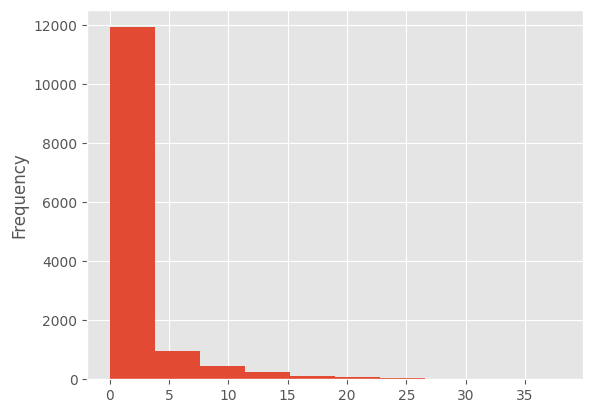

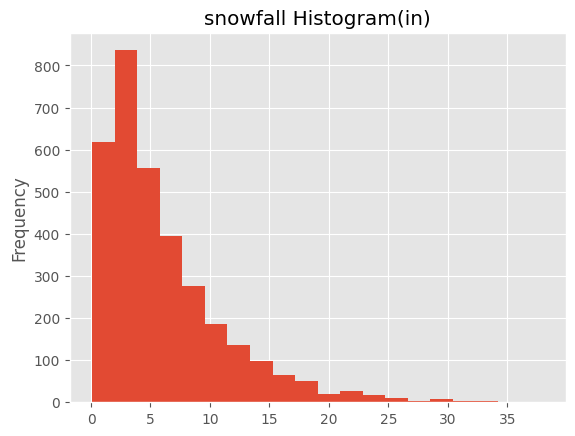

In [79]:
snow.plot.hist()  # heavily skewed
plt.show()

snow[snow>0].plot.hist(bins=20,title='snowfall Histogram(in)')
plt.show()

## box

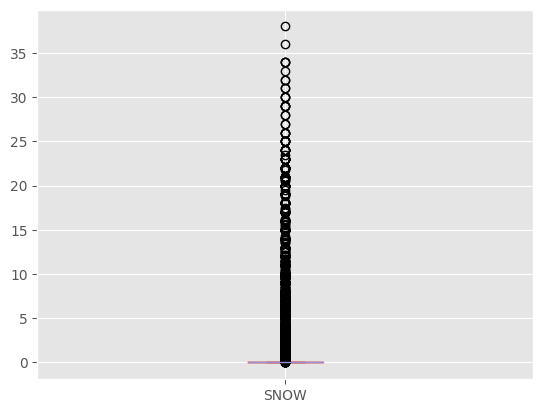

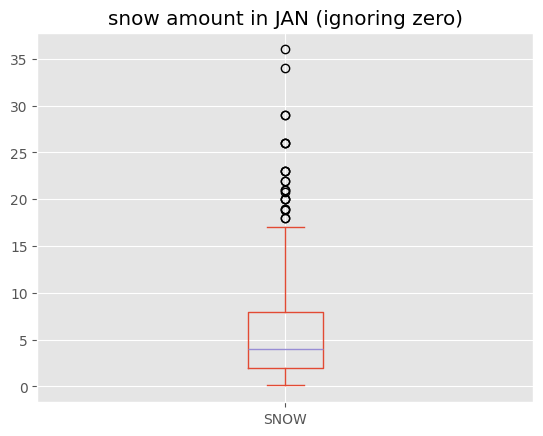

In [80]:
snow.plot.box()
plt.show()

snow[lambda s:(s.index.month==1) &(s>0)].plot.box(title="snow amount in JAN (ignoring zero)")
plt.show()

## kde
This is essentially a smoothed histogram

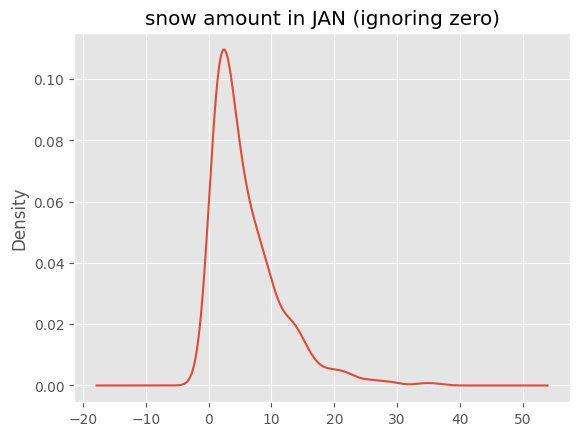

In [81]:
snow[lambda s:(s.index.month==1) &(s>0)].plot.kde(title="snow amount in JAN (ignoring zero)")
plt.show()

## line

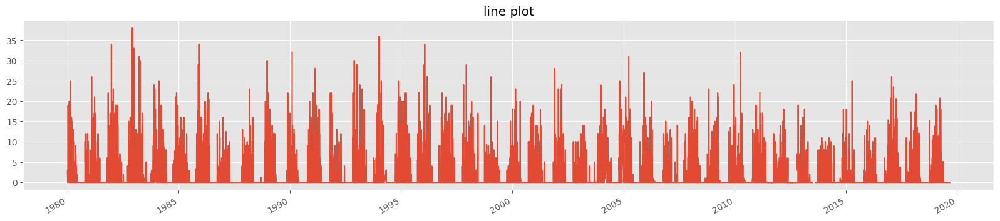

/tmp/ipykernel_6337/1949249319.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  snow.resample('M').mean().plot.line(title='mean of snowfall on monthly basis',figsize=((14,6)))


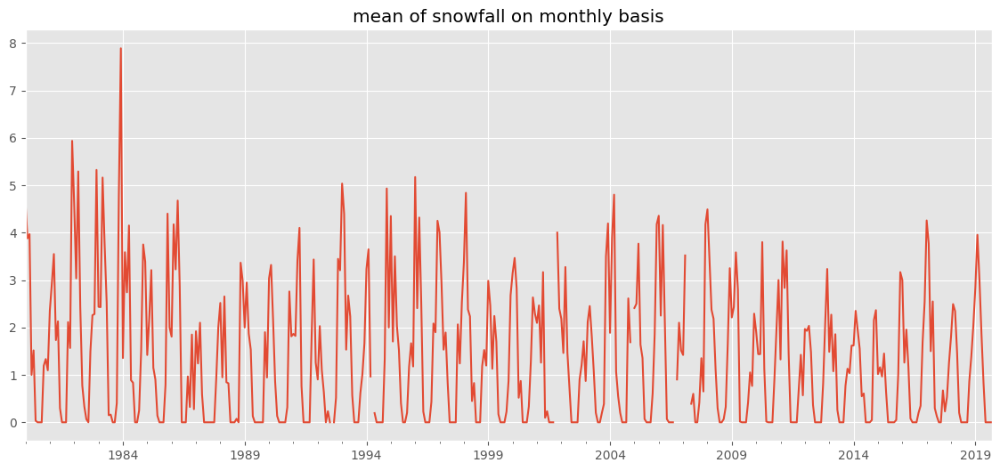

In [82]:
snow.plot.line(title='line plot',figsize=(20,4))
plt.show()

snow.resample('M').mean().plot.line(title='mean of snowfall on monthly basis',figsize=((14,6)))
plt.show()

## line plot with multiple aggregations

Plotting can be even more powerful with dataframes. If we chain the `.unstack` method, we can pull out the inner index into columns and create a df that has a column for each axis

/tmp/ipykernel_6337/2867171743.py:1: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  snow.resample('Q').quantile([.5,.9,.99]).unstack().plot.line(title="quantile on Quartile basis")


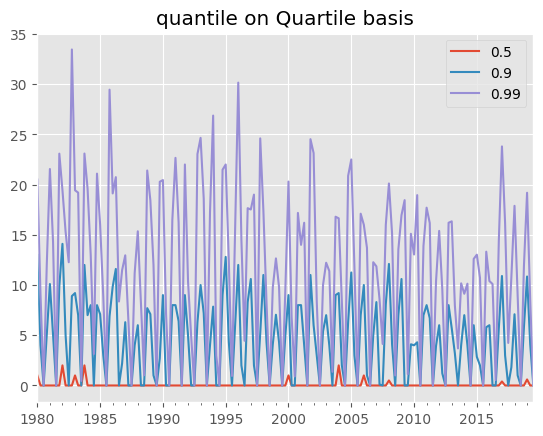

In [83]:
snow.resample('Q').quantile([.5,.9,.99]).unstack().plot.line(title="quantile on Quartile basis")
plt.show()

## bar

/tmp/ipykernel_6337/1980767567.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  season2017.resample('M').sum().div(season2017.sum()).mul(100).rename(lambda idx:idx.month_name()).plot.barh(title="2017 monthly percent of snowfall")


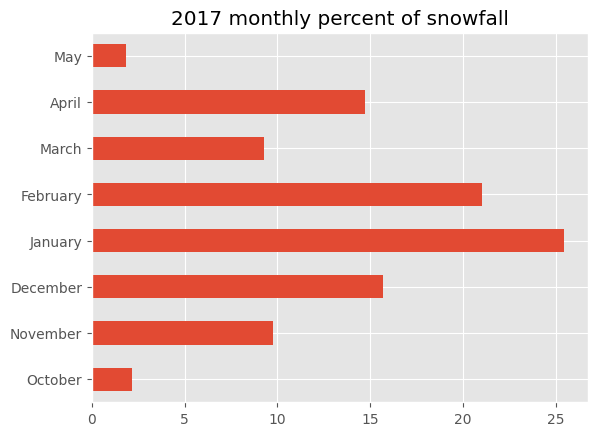

In [84]:
season2017.resample('M').sum().div(season2017.sum()).mul(100).rename(lambda idx:idx.month_name()).plot.barh(title="2017 monthly percent of snowfall")
plt.show()


## pie

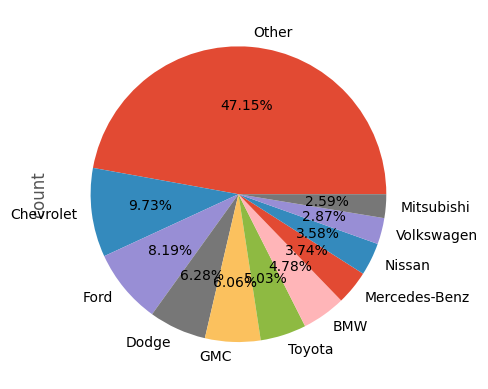

In [85]:
make.where(make.isin(top10),'Other').value_counts().plot.pie(autopct="%.2f%%")
plt.show()

/tmp/ipykernel_6337/4104180323.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  season2017.resample("M").sum().div(season2017.sum()).mul(100).rename(lambda idx:idx.month_name()).plot.pie(autopct="%.2f%%",title="2017 montly percent of snowfall")


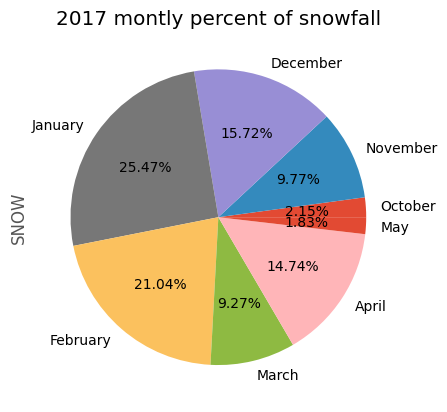

In [86]:
season2017.resample("M").sum().div(season2017.sum()).mul(100).rename(lambda idx:idx.month_name()).plot.pie(autopct="%.2f%%",title="2017 montly percent of snowfall")
plt.show()

## styling

#  Categorical Manipulation

Categorical data is textual data that has repetations.

## Categorical data

- there are repeated values, and if they've an intrinsic order, they are referred as `ordinal` values.

e.g) small, medium, large, extra-large

- unordered values such as colors are called `nominal` values.

In [87]:
category_make = make.astype('category')

print(f"dtype of make:: \n{category_make.dtype}")

dtype of make:: 
category


## Frequency Counts

In [88]:
print(f"Frequency counts::\n{category_make.value_counts()}")

Frequency counts::
make
Chevrolet                             4003
Ford                                  3371
Dodge                                 2583
GMC                                   2494
Toyota                                2071
                                      ... 
S and S Coach Company  E.p. Dutton       1
Shelby                                   1
Superior Coaches Div E.p. Dutton         1
Volga Associated Automobile              1
Vixen Motor Company                      1
Name: count, Length: 136, dtype: int64


In [89]:
print(f"records in make:: {category_make.shape}")
print(f"nunique in make:: {category_make.nunique()}")

records in make:: (41144,)
nunique in make:: 136


## benefits of categories
- memory usage
- categorical computation can be faster for many operations

In [90]:
print(f"object memory usage:: {make.memory_usage(deep=True)}")
print(f"category memory usage:: {category_make.memory_usage(deep=True)}")

object memory usage:: 2277247
category memory usage:: 94804


In [91]:
%%timeit
make.str.upper()

3.59 ms ± 71.5 μs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [92]:
%%timeit
category_make.str.upper()

355 μs ± 3.44 μs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


## conversion to Ordinal categories

In [93]:
make_type = pd.CategoricalDtype(
    categories=sorted(make.unique()),
    ordered=True
    )

ordered_make = make.astype(make_type)
print(f"ordered make::\n{ordered_make}")


print(f"max in ordered make:: {ordered_make.max()}")

ordered make::
0        Alfa Romeo
1           Ferrari
2             Dodge
3             Dodge
4            Subaru
            ...    
41139        Subaru
41140        Subaru
41141        Subaru
41142        Subaru
41143        Subaru
Name: make, Length: 41144, dtype: category
Categories (136, object): ['AM General' < 'ASC Incorporated' < 'Acura' < 'Alfa Romeo' ... 'Volvo' < 'Wallace Environmental' < 'Yugo' < 'smart']
max in ordered make:: smart


## .cat accessor

additional feasilities for cat attributes

In [94]:
ordered_make.cat.reorder_categories(
    sorted(category_make.cat.categories,key=str.lower)
)

0        Alfa Romeo
1           Ferrari
2             Dodge
3             Dodge
4            Subaru
            ...    
41139        Subaru
41140        Subaru
41141        Subaru
41142        Subaru
41143        Subaru
Name: make, Length: 41144, dtype: category
Categories (136, object): ['Acura' < 'Alfa Romeo' < 'AM General' < 'American Motors Corporation' ... 'Volvo' < 'VPG' < 'Wallace Environmental' < 'Yugo']

## category gotchas

There are few oddities to be aware of with categorical data. Applying the .value_counts method
or .groupby to categorical data uses all of the categories even if there were no values for them

In [95]:
print(f"{category_make.iloc[:100].value_counts()}")  # returns every categories


print(f"{category_make.iloc[0]}")  # << scaler
print(f"{category_make.iloc[[0,1]]}")  # category with all categories

make
Dodge                          17
Ford                            8
Oldsmobile                      8
Buick                           7
Plymouth                        5
                               ..
Vector                          0
Volga Associated Automobile     0
Wallace Environmental           0
Yugo                            0
smart                           0
Name: count, Length: 136, dtype: int64
Alfa Romeo
0    Alfa Romeo
1       Ferrari
Name: make, dtype: category
Categories (136, object): ['AM General', 'ASC Incorporated', 'Acura', 'Alfa Romeo', ..., 'Volvo', 'Wallace Environmental', 'Yugo', 'smart']


#  Dataframes
In pandas, the two-dimensional counterpart to the one-dimensional Series is the DataFrame

## database and spreedsheet analogues

## simple python version

## Dataframes

In [96]:
df = pd.DataFrame({
    'growth':[.5,.7,1.2],
    'name':['Paul','George','Ringo']
})

print(df)

print(df.iloc[2])
print(df['name'])

   growth    name
0     0.5    Paul
1     0.7  George
2     1.2   Ringo
growth      1.2
name      Ringo
Name: 2, dtype: object
0      Paul
1    George
2     Ringo
Name: name, dtype: object


## Construction
created from many types of input:
- columns (dicts of list)
- rows (lost of dicts)
- csv
- numpy
- sql,HDF5,parquet,arrow,etc

## Dataframe Axis
- axis=0 "index" "rows"
- axis=1 "columns

In [97]:
print(f"axes=0:: {df.axes[0]}")
print(f"axes=1:: {df.axes[1]}")

axes=0:: RangeIndex(start=0, stop=3, step=1)
axes=1:: Index(['growth', 'name'], dtype='object')


#  Similarities with Series and DataFrame

## getting the data

In [98]:
df = pd.read_csv('./assets/siena2018-pres.csv',index_col=0)
print(f"{df.sample(5).to_string()}")
print(f"dtypes::\n{df.dtypes}")

   Seq.         President       Party  Bg  Im  Int  IQ   L  WR  AC  EAb  LA  CAb  OA  PL  RC  CAp  HE  EAp  DA  FPA  AM  EV   O
17   17    Andrew Johnson  Democratic  42  42   41  42  40  34  43   43  43   44  42  44  43   44  43   42  43   41  43  43  44
24   25  William McKinley  Republican  29  20   20  26  32  22  21   17  19   22  20  11  12   23  16   17  20   14  13  20  20
18   18  Ulysses S. Grant  Republican  20  24   25  24  26  18  17   27  18   26  26  24  19   24  26   38  24   24  31  24  24
30   31    Herbert Hoover  Republican  13  35   15  13  43  37  36   29  36   29  29  32  33   26  44   35  39   33  40  35  36
36   37     Richard Nixon  Republican  16  21   43  16  36  12  30   24  28   27  25  22  34   32  23   28  22   16  42  38  29
dtypes::
Seq.         object
President    object
Party        object
Bg            int64
Im            int64
Int           int64
IQ            int64
L             int64
WR            int64
AC            int64
EAb           int64
LA 

In [99]:
def tweak_siena_pres(df:pd.DataFrame):
    def int64_to_unint8(df_:pd.DataFrame):
        cols = df_.select_dtypes('int64')
        return(
            df_.astype({col:'uint8' for col in cols})
        )

    return (
        df
            .rename(columns={'Seq.':'Seq'})
            .rename(columns= {k: v.replace(' ','_') for k,v in {
                        'Bg':'Background',
                        "PL":"Party leadership",
                        "CAb":"Communication ability",
                        "RC":'Relations with Congress',
                        'L':"Luck",
                        "CAp":'Court appointments',
                        "HE":'Handling economy',
                        'AC':'Ability to compromise',
                        "WR":'Willing to take risks',
                        "EAp":'Executive appointments',
                        "OA":'Overall ability',
                        "Im":"Integrity",
                        "DA":'Executive ability',
                        "FPA":'Foreign policy accomplishments',
                        'Int':"Integrity",
                        "EAb":'Executive ability',
                        "LA":"leadership ability",
                        'IQ':'Intelligence',
                        "AM":"Avoid crucial mistakes",
                        'EV':"Experts view",
                        'O':"Overall"
                    }.items()})
            .astype({'Party':'category'})
            .pipe(int64_to_unint8)
            .assign(
                Average_rank = lambda df_:(df_.select_dtypes('uint8')).sum(axis=1).rank(method='dense').astype('uint8'),
                Quartile =     lambda df_:pd.qcut(df_.Average_rank,4,labels='1st 2nd 3rd 4th'.split())
            )
    
    )

In [100]:
def tweak_snow(df_:pd.DataFrame):
    return (
        df_.rename(columns=lambda c:c.lower().replace(' ','_').replace('.',''))
            .assign(
                obs_date = lambda df2:pd.to_datetime(df2.obs_date),
                precip = df_['Precip.'].replace('T',0).astype(float)
            )
    )

## view data

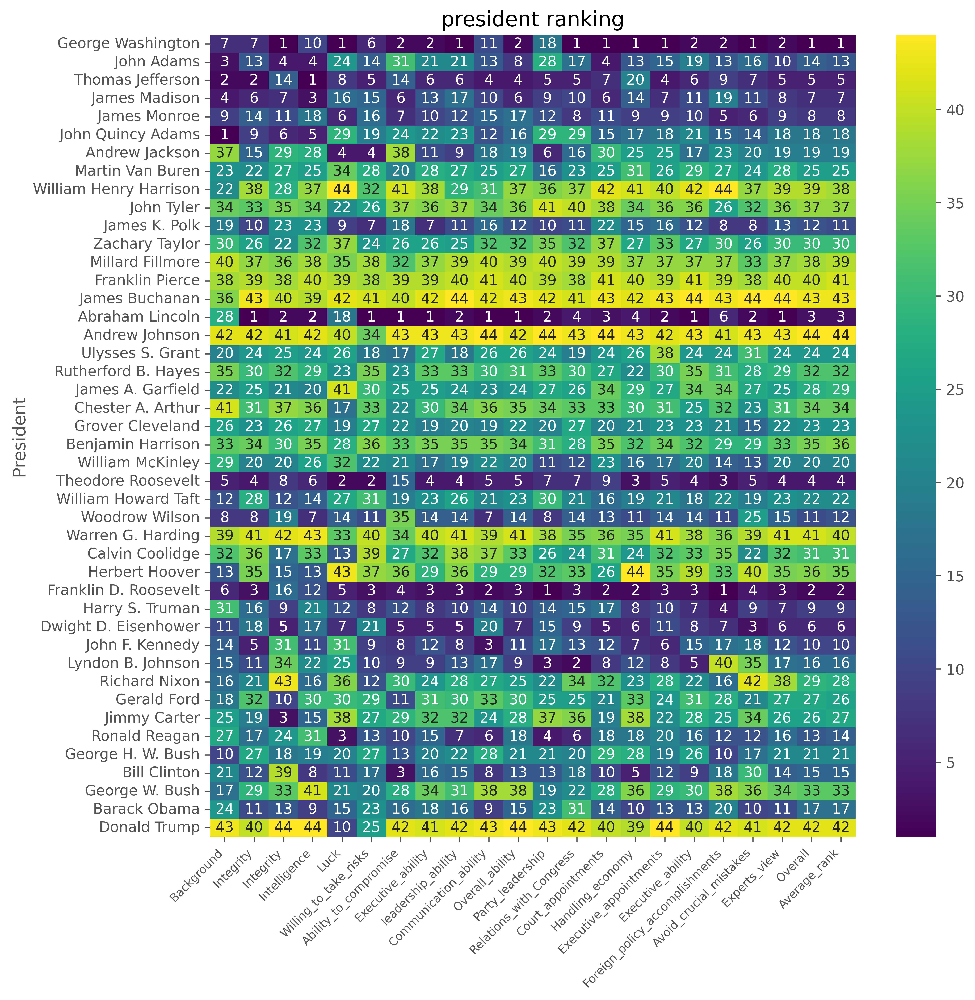

In [101]:
fig,ax = plt.subplots(figsize=(10,10),dpi=600)
g = sns.heatmap(
        tweak_siena_pres(df).set_index('President').iloc[:,2:-1],
        annot=True,
        cmap="viridis",
        ax=ax
    )
g.set_xticklabels(g.get_xticklabels(),rotation=45,fontsize=8,ha='right')
_ = plt.title('president ranking')

In [102]:
pres = tweak_siena_pres(df)
print(f"{pres.head(3).to_string()}")

  Seq          President                  Party  Background  Integrity  Integrity  Intelligence  Luck  Willing_to_take_risks  Ability_to_compromise  Executive_ability  leadership_ability  Communication_ability  Overall_ability  Party_leadership  Relations_with_Congress  Court_appointments  Handling_economy  Executive_appointments  Executive_ability  Foreign_policy_accomplishments  Avoid_crucial_mistakes  Experts_view  Overall  Average_rank Quartile
1   1  George Washington            Independent           7          7          1            10     1                      6                      2                  2                   1                     11                2                18                        1                   1                 1                       1                  2                               2                       1             2        1             1      1st
2   2         John Adams             Federalist           3         13          4             

#  Math Methods in DataFrames

math operation in DF, we generally perform math operation on series 

In [103]:
print(f"correlation::\n{pres.loc[:,'Background':'Average_rank'].corr().T.to_string()}")

correlation::
                                Background  Integrity  Integrity  Intelligence      Luck  Willing_to_take_risks  Ability_to_compromise  Executive_ability  leadership_ability  Communication_ability  Overall_ability  Party_leadership  Relations_with_Congress  Court_appointments  Handling_economy  Executive_appointments  Executive_ability  Foreign_policy_accomplishments  Avoid_crucial_mistakes  Experts_view   Overall  Average_rank
Background                        1.000000   0.682097   0.639879      0.797733  0.285655               0.547099               0.524313           0.619876            0.604719               0.668765         0.717347          0.544320                 0.624919            0.747838          0.562703                0.696631           0.604282                        0.615807                0.517622      0.656802  0.700424      0.709615
Integrity                         0.682097   1.000000   0.586304      0.851222  0.580809               0.891550           

## Index alignment

In [104]:
scores = pres.loc[:,'Background':"Average_rank"]
print(f"{scores.head(5).T.to_string()}")

print(f"{scores.iloc[:3,:4].T.to_string()}")
print(f"{scores.iloc[1:6,:5].T.to_string()}")

                                 1   2   3   4   5
Background                       7   3   2   4   9
Integrity                        7  13   2   6  14
Integrity                        1   4  14   7  11
Intelligence                    10   4   1   3  18
Luck                             1  24   8  16   6
Willing_to_take_risks            6  14   5  15  16
Ability_to_compromise            2  31  14   6   7
Executive_ability                2  21   6  13  10
leadership_ability               1  21   6  17  12
Communication_ability           11  13   4  10  15
Overall_ability                  2   8   4   6  17
Party_leadership                18  28   5   9  12
Relations_with_Congress          1  17   5  10   8
Court_appointments               1   4   7   6  11
Handling_economy                 1  13  20  14   9
Executive_appointments           1  15   4   7   9
Executive_ability                2  19   6  11  10
Foreign_policy_accomplishments   2  13   9  19   5
Avoid_crucial_mistakes         

## duplicate index

In [105]:
print(f"{pd.concat([scores.iloc[1:6,:5]]*2).index.duplicated().any()}")

True


#  Looping and Aggregation

## for loops

In [106]:
# iteration over rows (index, row(as a series)) tuple
for idx,row in pres.iterrows():
    print(idx,type(row))
    break

# iteration ove rows as namedtuple (index as first item)
for tup in pres.itertuples():
    print(tup[0],tup.Party)
    break

1 <class 'pandas.core.series.Series'>
1 Independent


## aggregaions
aggregation found in series are also applicable to dataframe. we can aggregate across both dimensions. So you can sum along axis 0 (the index) or axis 1 (the columns)

In [107]:
print(f"some aggregation method ::\n{pres.select_dtypes('number').agg(['count','size','sum']).T.to_string()}")

print(f"some aggregation method ::\n{pres.select_dtypes('number').agg({'Luck':['count','size'], 'Overall':['count','max']})}")

some aggregation method ::
                               count size  sum
Background                        44   44  968
Integrity                         44   44  957
Integrity                         44   44  990
Intelligence                      44   44  990
Luck                              44   44  990
Willing_to_take_risks             44   44  953
Ability_to_compromise             44   44  968
Executive_ability                 44   44  978
leadership_ability                44   44  990
Communication_ability             44   44  990
Overall_ability                   44   44  990
Party_leadership                  44   44  990
Relations_with_Congress           44   44  979
Court_appointments                44   44  990
Handling_economy                  44   44  990
Executive_appointments            44   44  990
Executive_ability                 44   44  990
Foreign_policy_accomplishments    44   44  990
Avoid_crucial_mistakes            44   44  990
Experts_view                     

In [108]:
print(f"describe::\n{pres.describe(include='all').T.to_string()}")

describe::
                               count unique                top freq       mean        std  min    25%   50%    75%   max
Seq                               44     44                  1    1        NaN        NaN  NaN    NaN   NaN    NaN   NaN
President                         44     44  George Washington    1        NaN        NaN  NaN    NaN   NaN    NaN   NaN
Party                             44      6         Republican   19        NaN        NaN  NaN    NaN   NaN    NaN   NaN
Background                      44.0    NaN                NaN  NaN       22.0  12.409674  1.0  11.75  22.0  32.25  43.0
Integrity                       44.0    NaN                NaN  NaN      21.75  12.519984  1.0   11.0  21.5  32.25  43.0
Integrity                       44.0    NaN                NaN  NaN       22.5  12.845233  1.0  11.75  22.5  33.25  44.0
Intelligence                    44.0    NaN                NaN  NaN       22.5  12.845233  1.0  11.75  22.5  33.25  44.0
Luck                 

## .apply method

#  Columns Types, .assign an Memory Usage

explore updating columns creating columns and chaning they types of columns. we'll show how to see how this impats memory usage.

## Conversion methods
`.astype` method allows us to specify the types of each column with a dictonary.

`.assign` method is a key method to master. method returns new dataframe it doesn't mutate the existing dataframe

## memory usage

In [109]:
print(f"{df.memory_usage(deep='True')}")
print(f"{pres.info(memory_usage='True')}")

Index         352
Seq.         2238
President    2823
Party        2624
Bg            352
Im            352
Int           352
IQ            352
L             352
WR            352
AC            352
EAb           352
LA            352
CAb           352
OA            352
PL            352
RC            352
CAp           352
HE            352
EAp           352
DA            352
FPA           352
AM            352
EV            352
O             352
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 44 entries, 1 to 44
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype   
---  ------                          --------------  -----   
 0   Seq                             44 non-null     object  
 1   President                       44 non-null     object  
 2   Party                           44 non-null     category
 3   Background                      44 non-null     uint8   
 4   Integrity                       44 non-null     uint8   
 5   

#  Creating and Updating Columns

## Loading the Data

In [110]:
jb = pd.read_csv('./assets/2020-jetbrains-python-survey.csv')
print(f"{jb.head(10).T.to_string()}")

/tmp/ipykernel_6337/504347139.py:1: DtypeWarning: Columns (152) have mixed types. Specify dtype option on import or set low_memory=False.
  jb = pd.read_csv('./assets/2020-jetbrains-python-survey.csv')


                                                                                                                            0                                                   1                                                            2                                                            3                                                            4                                                            5    6                                            7                                                                 8                                                                                               9
is.python.main                                                                                                            Yes                                                 Yes                                                          Yes                                                          Yes                                                          Yes      

In [111]:
import collections

counter = collections.defaultdict(list)
for col in sorted(jb.columns):
    period_count = col.count('.')
    if period_count>=2: part_end=2
    else:
        part_end=1
    parts = col.split('.')[:part_end]
    counter['.'.join(parts)].append(col)

uniq_cols= []
for cols in counter.values():
    if len(cols)==1:
        uniq_cols.extend(cols)

print(uniq_cols)

print(f"age::\n{jb[uniq_cols].rename(columns=lambda x:x.replace('.','_')).age.value_counts(dropna=False)}")

print(f"\n{jb[uniq_cols].rename(columns=lambda x:x.replace('.','_')).age.str.slice(0,2).astype(float)}")

['age', 'are.you.datascientist', 'company.size', 'country.live', 'employment.status', 'first.learn.about.main.ide', 'how.often.use.main.ide', 'ide.main', 'is.python.main', 'job.team', 'main.purposes', 'missing.features.main.ide', 'nps.main.ide', 'python.years', 'python2.version.most', 'python3.version.most', 'several.projects', 'team.size', 'use.python.most', 'years.of.coding']
age::
age
NaN            29701
21–29           9710
30–39           7512
40–49           3010
18–20           2567
50–59           1374
60 or older      588
Name: count, dtype: int64

0        30.0
1        21.0
2        30.0
3         NaN
4        21.0
         ... 
54457    21.0
54458     NaN
54459    21.0
54460    30.0
54461    21.0
Name: age, Length: 54462, dtype: float64


In [112]:
jb2 = jb[uniq_cols]
age_slice = jb.age.str.slice(0,2)
age_float = age_slice.astype(float)
age_int = age_slice.astype('Int64')
jb2['age'] = age_int

/tmp/ipykernel_6337/3859218300.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  jb2['age'] = age_int


In [113]:
print(f"{jb[uniq_cols].rename(columns=lambda x:x.replace('.','_')).assign(age=lambda df_:df_.age.str.slice(0,2).astype(float).astype('Int64')   ).sample(10).T.to_string()}")

                           29516                                              51071       3019  7700                                               14132                                                                                           43520 15830                                       1348                                        54309       44565
age                         <NA>                                                 30        <NA>  <NA>                                                 21                                                                                              60  <NA>                                          21                                          21        <NA>
are_you_datascientist        NaN                                                Yes         NaN   NaN                                                NaN                                                                                              No   NaN                                    

## more column cleanup

In [114]:
def tweak_jb(jb):
    return (jb[uniq_cols].rename(columns=lambda x:x.replace('.','_'))\
            .assign(
                age= lambda df_:df_.age.str.slice(0,2).astype('Int64'),
                are_you_datascientist= lambda df_:df_.are_you_datascientist.replace({'Yes':True,'No':False,np.nan:False}),
                team_size = lambda df_:df_.team_size.str.split(r'-',n=1,expand=True).iloc[:,0].replace('More than 40 people',41).where(df_.company_size!=1,1).astype(float),
                is_python_main = lambda df_:df_.is_python_main.astype('category'),
                country_live = lambda df_:df_.country_live.astype('category'),
                employment_status = lambda df_:df_.employment_status.fillna('Other').astype('category'),
                company_size = lambda df_:df_.company_size.replace(
                    {
                        'Just me':1,
                        'Not sure':np.nan,
                        'More than 5,000':5000,
                        '2–10':2,
                        '11–50':11,
                        '51–500':51,
                        '501–1,000':501,
                        '1,001–5,000':1001,
                    }
                ).astype('Int64'),
                years_of_coding = lambda df_:df_.python_years.replace('Less than 1 year',.5).str.extract(r'(\d+)').astype(float),
                python3_ver = lambda df_:df_.python3_version_most.str.replace('_','.').str.extract(r'(\d\.\d)').astype(float),
                use_python_most = lambda df_:df_.use_python_most.fillna('Unknown')
            )\
            .drop(columns=['python2_version_most'])\
            .dropna())

In [115]:
jb2 = tweak_jb(jb)

/tmp/ipykernel_6337/1837127613.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  company_size = lambda df_:df_.company_size.replace(


In [116]:
print(f"{jb2.sample(10).T.to_string()}")

                                                                 22353                                              34075                                                        26729                                       33590                                       5956                                        21161                                              44321                                                                                           24767                                              38263                                       11333
age                                                                 40                                                 30                                                           21                                          21                                          30                                          21                                                 30                                                                              

In [117]:
# adding margins:: put `All` columns
# adding normalize:: calc percentage of each cell, 'columns' or 'rows'
pd.crosstab(index=jb2.country_live, columns=jb2.age,margins= True,normalize=False)

age,18,21,30,40,50,60,All
country_live,,,,,,,
Algeria,1,4,3,0,0,0,8
Argentina,1,28,32,14,3,0,78
Armenia,1,11,1,0,0,0,13
Australia,1,39,84,40,12,4,180
Austria,0,19,39,13,3,0,74
...,...,...,...,...,...,...,...
Uruguay,0,4,12,0,0,0,16
Uzbekistan,0,2,0,0,0,0,2
Venezuela,0,8,0,3,1,0,12


In [118]:
# hierarchical
pd.crosstab(index=[jb2.country_live,jb2.age],columns=[jb2.use_python_most,jb2.python3_version_most]).loc[['Algeria']]

use_python_most      Computer graphics                        \
python3_version_most        Python 3_6 Python 3_7 Python 3_8   
country_live age                                               
Algeria      18                      0          0          0   
             21                      0          0          0   
             30                      0          0          0   

use_python_most            Data analysis                                   \
python3_version_most Python 3_5 or lower Python 3_6 Python 3_7 Python 3_8   
country_live age                                                            
Algeria      18                        0          0          0          0   
             21                        0          0          0          0   
             30                        0          0          0          0   

use_python_most                 Desktop development             ...  \
python3_version_most Python 3_9 Python 3_5 or lower Python 3_6  ...   
country_live age                                                ...   
Algeria      18               0                   0          0  ...   
             21               0                   0          0  ...   
             30               0                   0          0  ...   

use_python_most                  Unknown                                   \
python3_version_most Python 3_5 or lower Python 3_6 Python 3_7 Python 3_8   
country_live age                                                            
Algeria      18                        0          0          0          1   
             21                        0          0          0          1   
             30                        0          0          0          0   

use_python_most                     Web development                        \
python3_version_most Python 3_9 Python 3_5 or lower Python 3_6 Python 3_7   
country_live age                                                            
Algeria      18               0                   0          0          0   
             21               1                   0          0          1   
             30               0                   0          0          1   

use_python_most                             
python3_version_most Python 3_8 Python 3_9  
country_live age                            
Algeria      18               0          0  
             21               1          0  
             30               1          0  

[3 rows x 77 columns]

In [120]:
# heatmap
(pd.crosstab(index=[jb2.country_live, jb2.age],
        columns=[jb2.use_python_most, jb2.python3_version_most])
     .loc[['United States'], ['Data analysis', 'Web development']]
#      .style.background_gradient(cmap='viridis', axis=None)
    )


use_python_most            Data analysis                                   \
python3_version_most Python 3_5 or lower Python 3_6 Python 3_7 Python 3_8   
country_live  age                                                           
United States 18                       0          0          1          1   
              21                       1         11         28         32   
              30                       1         11         35         42   
              40                       0         10         17         21   
              50                       2          3          9         13   
              60                       0          1          4          2   

use_python_most                     Web development                        \
python3_version_most Python 3_9 Python 3_5 or lower Python 3_6 Python 3_7   
country_live  age                                                           
United States 18              0                   0          0          0   
              21              7                   2         25         41   
              30              8                   3         48         63   
              40              1                   1          8         20   
              50              0                   0          9          8   
              60              0                   0          3          3   

use_python_most                             
python3_version_most Python 3_8 Python 3_9  
country_live  age                           
United States 18              2          0  
              21             54          2  
              30             93         12  
              40             41          7  
              50              7          1  
              60              3          1

#  Dealing with Missing and Duplicated Data

already seen for series, let's apply for dataframe

## Missing data

In [121]:
print(f"count isna::\n{pres.isna().sum()}")

print(f"percent of isna::\n{pres.isna().mean().mul(100)}")

count isna::
Seq                               0
President                         0
Party                             0
Background                        0
Integrity                         0
Integrity                         0
Intelligence                      0
Luck                              0
Willing_to_take_risks             0
Ability_to_compromise             0
Executive_ability                 0
leadership_ability                0
Communication_ability             0
Overall_ability                   0
Party_leadership                  0
Relations_with_Congress           0
Court_appointments                0
Handling_economy                  0
Executive_appointments            0
Executive_ability                 0
Foreign_policy_accomplishments    0
Avoid_crucial_mistakes            0
Experts_view                      0
Overall                           0
Average_rank                      0
Quartile                          0
dtype: int64
percent of isna::
Seq                 

## duplicates

In [122]:
print(f"drop duplicated::\n{pres.drop_duplicates().T.to_string()}")

print(f"drop duplicated::\n{pres.drop_duplicates(subset='Party',keep=False).T.to_string()}")

drop duplicated::
                                               1           2                      3                      4                      5                      6               7                 8                       9            10             11              12                13               14              15               16              17                18                   19                 20                 21                22                 23                24                  25                   26              27                 28               29              30                     31               32                    33               34                 35             36           37            38             39                 40            41              42            43            44
Seq                                             1           2                      3                      4                      5                      6               7

#  Sorting Columns and Indexes
will explore sorting columns and index values

## Soring columns

In [123]:
print(f"sort by Party::\n{pres.sort_values(by='Party').T.to_string()}")

print(f"sort by Party and rank on ascend and desc respectively::\n{pres.sort_values(by=['Party','Average_rank'],ascending=[True,False]).T.to_string()}")

sort by Party::
                                              22                     31              17               32              15               14               34                 35             11            38            41                8               7               27            43                     6                      5                      4                      3           2                  1            10                 20              42                 40             39           37             36                 21               16                    33              30               29                 28                   19                   26                  25                24                 23                18            44                13              12                      9 
Seq                                        22/24                     32              17               33              15               14               35                 


## Sorting columns Order


## Setting and Sorting the index

In [124]:
print(f"{pres.set_index('Party').sort_index().to_string()}")

                         Seq               President  Background  Integrity  Integrity  Intelligence  Luck  Willing_to_take_risks  Ability_to_compromise  Executive_ability  leadership_ability  Communication_ability  Overall_ability  Party_leadership  Relations_with_Congress  Court_appointments  Handling_economy  Executive_appointments  Executive_ability  Foreign_policy_accomplishments  Avoid_crucial_mistakes  Experts_view  Overall  Average_rank Quartile
Party                                                                                                                                                                                                                                                                                                                                                                                                                                                                    
Democratic             22/24        Grover Cleveland          26         23         

#  Filtering and Indexing Operations

Occasionally you will need to manipulate the index. This chapter will explore some of the operations to change the index and operations that result from that.

## Renaming an Index

In [125]:
def name_to_inital(val:str):
    name = val.split()
    return ' '.join([f'{name[0][0]}.',*name[1:]])

print(f"rename::\n{pres.set_index('President').rename(name_to_inital).T.to_string()}")

rename::
President                      G. Washington    J. Adams           T. Jefferson             J. Madison              J. Monroe        J. Quincy Adams  A. Jackson M. Van Buren W. Henry Harrison     J. Tyler  J. K. Polk Z. Taylor M. Fillmore   F. Pierce J. Buchanan  A. Lincoln  A. Johnson U. S. Grant R. B. Hayes J. A. Garfield C. A. Arthur G. Cleveland B. Harrison W. McKinley T. Roosevelt W. Howard Taft   W. Wilson W. G. Harding C. Coolidge   H. Hoover F. D. Roosevelt H. S. Truman D. D. Eisenhower J. F. Kennedy L. B. Johnson    R. Nixon     G. Ford   J. Carter   R. Reagan G. H. W. Bush  B. Clinton  G. W. Bush    B. Obama    D. Trump
Seq                                        1           2                      3                      4                      5                      6           7            8                 9           10          11        12          13          14          15          16          17          18          19             20           21        22/24  

## Resetting the Index
helps to monotonically increasing integer index

In [126]:
print(f'{pres.set_index("President").reset_index().T.to_string()}')

                                               0           1                      2                      3                      4                      5               6                 7                       8            9              10              11                12               13              14               15              16                17                   18                 19                 20                21                 22                23                  24                   25              26                 27               28              29                     30               31                    32               33                 34             35           36            37             38                 39            40              41            42            43
President                       George Washington  John Adams       Thomas Jefferson          James Madison           James Monroe      John Quincy Adams  Andrew Jackson  Martin Van Buren

## Dataframe Indexing, Filtering & Querying

In [127]:
lt10 = pres.Average_rank<10

print(f"{pres[lt10].T.to_string()}")

                                               1                      3                      4                      5                16                  25                     31               32                    33
Seq                                             1                      3                      4                      5               16                  26                     32               33                    34
President                       George Washington       Thomas Jefferson          James Madison           James Monroe  Abraham Lincoln  Theodore Roosevelt  Franklin D. Roosevelt  Harry S. Truman  Dwight D. Eisenhower
Party                                 Independent  Democratic-Republican  Democratic-Republican  Democratic-Republican       Republican          Republican             Democratic       Democratic            Republican
Background                                      7                      2                      4                      9          

In [128]:

print(f"republican president::\n{pres[lt10 & (pres['Party']=='Republican')].T.to_string()}")

republican president::
                                             16                  25                    33
Seq                                          16                  26                    34
President                       Abraham Lincoln  Theodore Roosevelt  Dwight D. Eisenhower
Party                                Republican          Republican            Republican
Background                                   28                   5                    11
Integrity                                     1                   4                    18
Integrity                                     2                   8                     5
Intelligence                                  2                   6                    17
Luck                                         18                   2                     7
Willing_to_take_risks                         1                   2                    21
Ability_to_compromise                         1                  15          

In [129]:
# pres.query('@lt10 and Party=="Republican"').T # prefix to variable with @, helps conditions

In [130]:
makes = ['Ford','Toyota']
vechicle:pd.DataFrame    = pd.read_csv("./assets/vehicles.csv.zip")
print(f'results::\n{vechicle.query("make.isin(@makes) and city08>50").sample(10).T.to_string()}')

results::
                                        33795                         26525                         32598                         23026                         28546                         25301                             24371                             34286                             30846                         23033
barrels08                            6.338654                         0.192                         0.186                         0.348                         0.192                         0.192                            6.5922                            6.5922                          6.338654                         0.348
barrelsA08                                0.0                           0.0                           0.0                           0.0                           0.0                           0.0                               0.0                               0.0                               0.0                           0.0
charge

/tmp/ipykernel_6337/2773440549.py:2: DtypeWarning: Columns (68,70,71,72,73,74,76,79) have mixed types. Specify dtype option on import or set low_memory=False.
  vechicle:pd.DataFrame    = pd.read_csv("./assets/vehicles.csv.zip")


## Indexing by Position

`.iloc` and `loc`

#  Plotting with DataFrames
will explore the built-in plotting capacbilities of pandas

## line plots

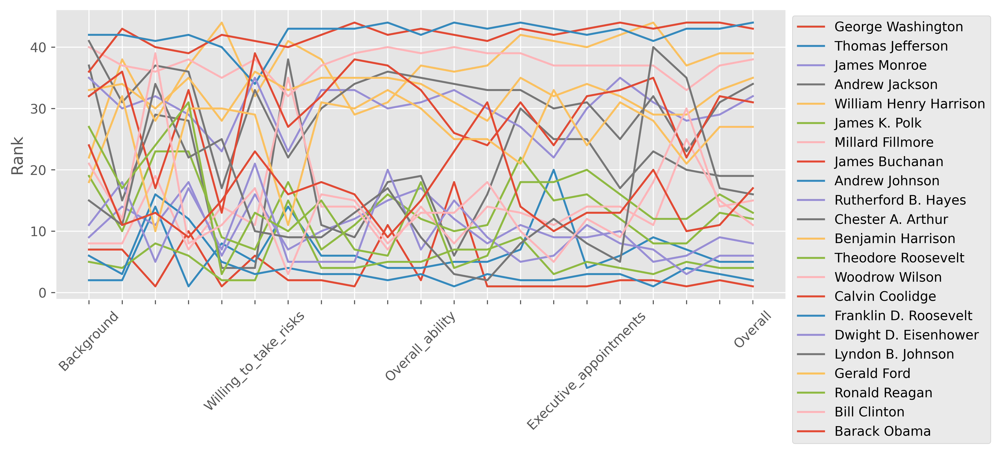

In [131]:
fig,ax = plt.subplots(dpi=600,figsize=(10,4))
pres.set_index("President").loc[::2,"Background":"Overall"].T.plot(ax=ax,rot=45).legend(bbox_to_anchor=(1,1))
ax.set_xticks(range(21))
ax.set_ylabel("Rank")
plt.show()


## bar

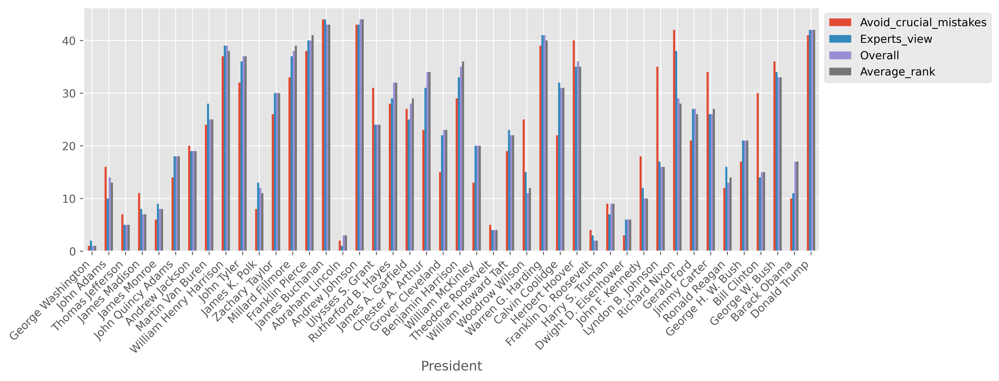

In [132]:
fig,ax = plt.subplots(dpi=600,figsize=(10,4))
pres.set_index("President").iloc[:,-5:].plot.bar(figsize=(12,4),ax=ax,rot=45).legend(bbox_to_anchor=(1,1))
ax.set_xticklabels(labels=ax.get_xticklabels(),ha='right')
plt.show()


## scatter

(44, 26)
                                                 19            43  \
Seq                                              19            44   
President                       Rutherford B. Hayes  Barack Obama   
Party                                    Republican    Democratic   
Background                                       35            24   
Integrity                                        30            11   
Integrity                                        32            13   
Intelligence                                     29             9   
Luck                                             23            15   
Willing_to_take_risks                            35            23   
Ability_to_compromise                            23            16   
Executive_ability                                33            18   
leadership_ability                               33            16   
Communication_ability                            30             9   
Overall_ability          

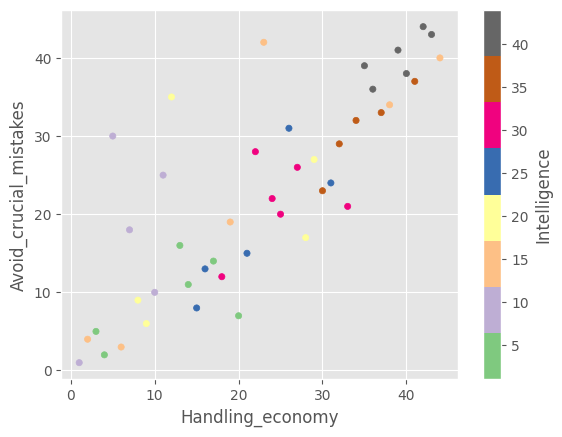

In [133]:
print(pres.shape)
print(f"{pres.sample(5).T}")

print(f"corr :: {pres['Handling_economy'].corr(pres['Avoid_crucial_mistakes'])}")

pres.plot.scatter(x="Handling_economy",y='Avoid_crucial_mistakes',c='Intelligence',cmap="Accent")
plt.show()



## area and stacked bar

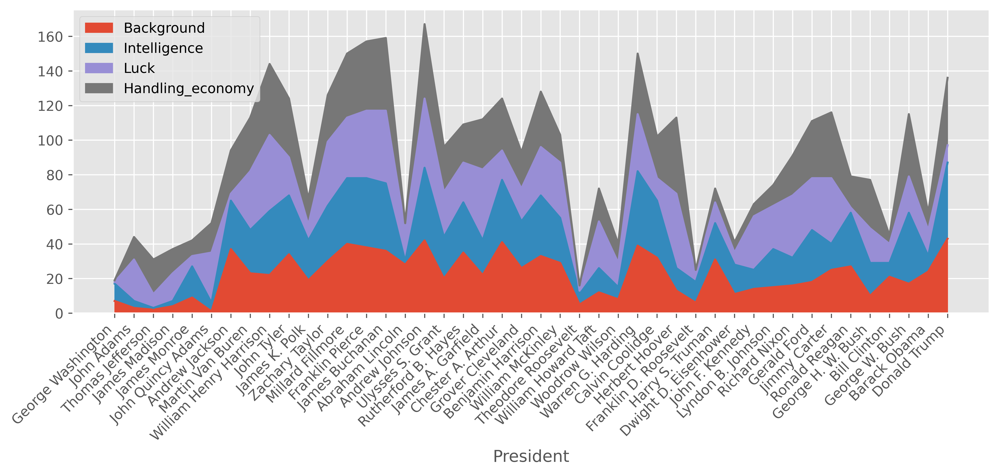

In [134]:
fig , ax = plt . subplots ( dpi =600 , figsize =(10 ,4))
pres.plot.area(x='President',y=["Background","Intelligence","Luck",'Handling_economy'],rot=45,figsize=(12,4),ax=ax)
ax.set_xticks(range(len(pres)))
ax.set_xticklabels(pres.President,ha='right')
plt.show()


## column distributions with KDEs,Histograms and Boxplots

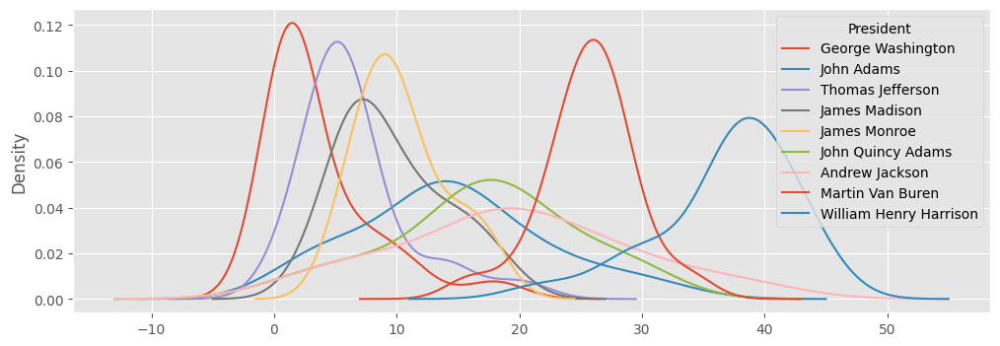

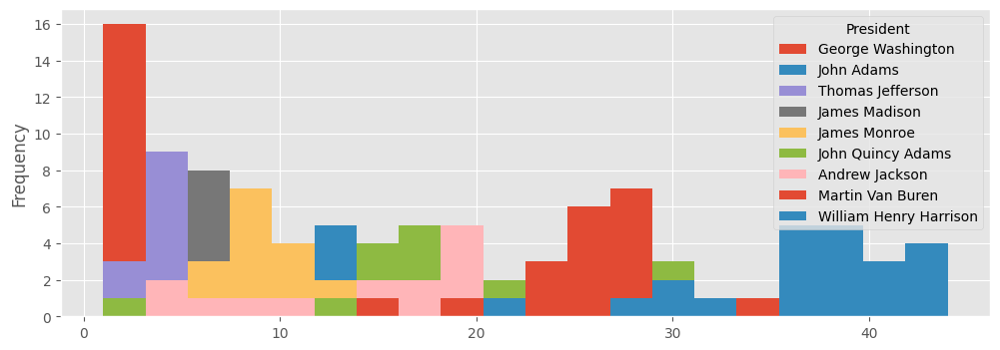

<Axes: >

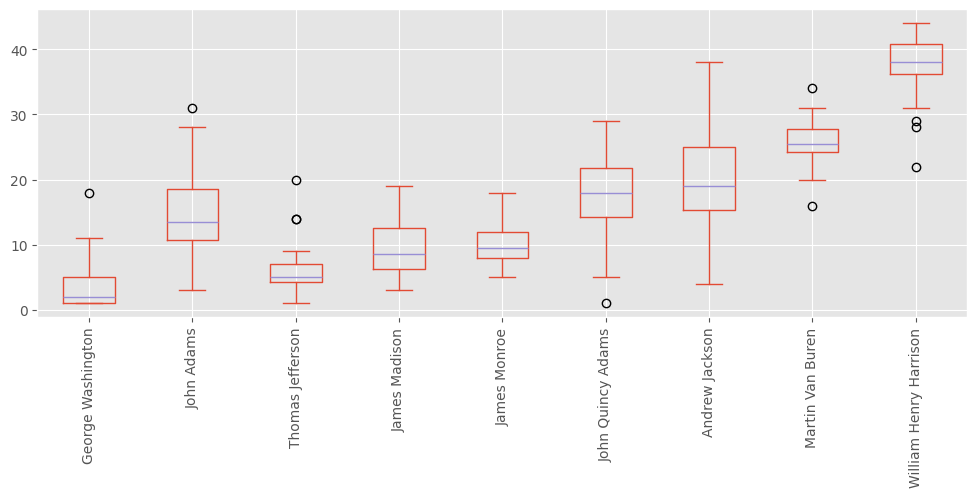

In [135]:
pres.set_index('President').loc[:,"Background":"Average_rank"].iloc[:9].T.plot.density(figsize=(12,4))
plt.show()

pres.set_index('President').loc[:,"Background":"Average_rank"].iloc[:9].T.plot.hist(bins=20,figsize=(12,4))
plt.show()

pres.set_index('President').loc[:,"Background":"Average_rank"].iloc[:9].T.plot.box(figsize=(12,4),rot=90)

#  Reshaping Dataframes with Dummies
will explore various options for manipulating and reshaping a dataframe

## dummy columns
one way to convert categorical to numeric columns. 

In [136]:
print(f"{jb.filter(like='job.role').sample(10).to_string()}")

      job.role.DBA job.role.Architect job.role.QA engineer job.role.Developer / Programmer job.role.Technical writer job.role.Technical support job.role.Data analyst job.role.Business analyst job.role.Team lead job.role.Product manager job.role.CIO / CEO / CTO job.role.Systems analyst job.role.Other
45012          NaN                NaN                  NaN                             NaN                       NaN                        NaN                   NaN                       NaN                NaN                      NaN                      NaN                      NaN            NaN
6356           NaN                NaN                  NaN                             NaN                       NaN                        NaN                   NaN                       NaN                NaN                      NaN                      NaN                      NaN            NaN
25104          NaN                NaN                  NaN                             NaN       

In [137]:
# scan along an axis and reports the index(or column) where maximum value is found
job =jb.filter(like='job.role').where(jb.isna(),1).fillna(0).idxmax(axis='columns').str.replace('job.role.','',regex=False)

print(job.shape)
print(job.value_counts())


dum = pd.get_dummies(job)
print(dum.sample(10).T.to_string())

(54462,)
DBA                       36303
Developer / Programmer     9934
Architect                  3118
Other                      1639
Data analyst                867
QA engineer                 672
Team lead                   659
Technical support           398
CIO / CEO / CTO             370
Business analyst            135
Product manager             129
Systems analyst             126
Technical writer            112
Name: count, dtype: int64
                        28101  2865   37650  19280  39510  39156  12453  30042  49205  35877
Architect               False  False  False  False  False  False  False  False   True  False
Business analyst        False  False  False  False  False  False  False  False  False  False
CIO / CEO / CTO         False  False  False  False  False  False  False  False  False  False
DBA                      True   True  False  False   True  False   True  False  False  False
Data analyst            False  False  False  False  False  False  False  False  Fals

/tmp/ipykernel_6337/3577538326.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  job =jb.filter(like='job.role').where(jb.isna(),1).fillna(0).idxmax(axis='columns').str.replace('job.role.','',regex=False)



## undoing dummy columns

In [138]:
print(f"{dum.idxmax(axis='columns')}")
i,j = np.where(dum)
print(f"{pd.Series(dum.columns[j],i)}")

0              Business analyst
1        Developer / Programmer
2        Developer / Programmer
3                           DBA
4                           DBA
                  ...          
54457           Systems analyst
54458                       DBA
54459           CIO / CEO / CTO
54460    Developer / Programmer
54461                 Architect
Length: 54462, dtype: object
0              Business analyst
1        Developer / Programmer
2        Developer / Programmer
3                           DBA
4                           DBA
                  ...          
54457           Systems analyst
54458                       DBA
54459           CIO / CEO / CTO
54460    Developer / Programmer
54461                 Architect
Length: 54462, dtype: object


#  Reshaping By Pivoting and Grouping
will explore one of the most powerful options for data manipulations, pivot tables
`.pivot_table`, `.groupby` and `pd.crosstab`

In [139]:
# ”What is the average age by the country for each employment status?
print(f"{jb2.pivot_table(index='country_live',columns='employment_status',values='age',aggfunc='mean').sample(10).to_string()}")
print()
print(f"{pd.crosstab(index=jb2.country_live, columns=jb2.employment_status,values=jb2.age,aggfunc='mean').sample(10).to_string()}")
print()
print(f"{jb2.groupby(['country_live','employment_status']).age.mean().unstack().sample(10).to_string()}")

employment_status   Fully employed by a company / organization  Partially employed by a company / organization  Self-employed (a person earning income directly from one's own business, trade, or profession)  Student  Working student
country_live                                                                                                                                                                                                                            
Czech Republic                                       27.646552                                           28.75                                                                                       31.470588     <NA>             21.5
New Zealand                                              31.75                                            <NA>                                                                                            <NA>     <NA>             <NA>
Egypt                                                25.090909      

/tmp/ipykernel_6337/4206445292.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  print(f"{jb2.pivot_table(index='country_live',columns='employment_status',values='age',aggfunc='mean').sample(10).to_string()}")
/tmp/ipykernel_6337/4206445292.py:6: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(f"{jb2.groupby(['country_live','employment_status']).age.mean().unstack().sample(10).to_string()}")


Many Programmers and SQL analysts find .groupby syntax intuitive, while EXCEL often feel more with .pivot_table and pd.crosstab

## Using a custom Aggregation function


In [140]:
def per_emacs(ser:pd.Series):
    return ser.str.contains("Emacs").sum()/len(ser)*100

print(f"{jb2.pivot_table(index='country_live',values='ide_main',aggfunc=per_emacs)}")

print(f"{jb2.groupby('country_live', observed=False)[['ide_main']].agg(per_emacs)}")

               ide_main
country_live           
Algeria        0.000000
Argentina      2.564103
Armenia        0.000000
Australia      3.333333
Austria        1.351351
...                 ...
United States  4.072948
Uruguay        0.000000
Uzbekistan     0.000000
Venezuela      0.000000
Viet Nam       0.000000

[76 rows x 1 columns]
               ide_main
country_live           
Algeria        0.000000
Argentina      2.564103
Armenia        0.000000
Australia      3.333333
Austria        1.351351
...                 ...
United States  4.072948
Uruguay        0.000000
Uzbekistan     0.000000
Venezuela      0.000000
Viet Nam       0.000000

[76 rows x 1 columns]


/tmp/ipykernel_6337/259544296.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  print(f"{jb2.pivot_table(index='country_live',values='ide_main',aggfunc=per_emacs)}")


## multiple aggregation


In [141]:
# jb2.pivot_table(index='country_live',values='age',aggfunc=(min,max))
print(f"{jb2.groupby('country_live',observed=False).age.agg([min,max])}")

               min  max
country_live           
Algeria         18   30
Argentina       18   50
Armenia         18   30
Australia       18   60
Austria         21   50
...            ...  ...
United States   18   60
Uruguay         21   30
Uzbekistan      21   21
Venezuela       21   50
Viet Nam        18   40

[76 rows x 2 columns]


/tmp/ipykernel_6337/170924286.py:2: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  print(f"{jb2.groupby('country_live',observed=False).age.agg([min,max])}")
/tmp/ipykernel_6337/170924286.py:2: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  print(f"{jb2.groupby('country_live',observed=False).age.agg([min,max])}")


## per column aggregations


In [142]:
# jb2.pivot_table(index='country_live',aggfunc=(min,max))
# jb2.groupby('country_live').agg([min,max])

jb2.pivot_table(index='country_live',aggfunc={
    'age':['min','max'],
    'team_size':'mean'
})


jb2.groupby('country_live').agg({
    'age':['min','max'],
    'team_size':'mean'
})

jb2.groupby('country_live').agg(
    age_min = ('age','min'),
    age_max = ('age','max'),
    team_size = ('team_size','mean')
)

/tmp/ipykernel_6337/1499835914.py:4: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  jb2.pivot_table(index='country_live',aggfunc={
/tmp/ipykernel_6337/1499835914.py:10: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  jb2.groupby('country_live').agg({
/tmp/ipykernel_6337/1499835914.py:15: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  jb2.groupby('country_live').agg(


,age_min,age_max,team_size
country_live,,,
Algeria,18,30,3.375000
Argentina,18,50,4.564103
Armenia,18,30,4.615385
Australia,18,60,3.394444
Austria,21,50,3.162162
...,...,...,...
United States,18,60,4.382979
Uruguay,21,30,3.812500
Uzbekistan,21,21,2.000000


## grouping by hierarchy

In [143]:
# jb2.pivot_table(index=['country_live','ide_main'],values='age',aggfunc=[min,max])
print(f"{jb2.groupby(by=['country_live','ide_main'])[['age']].agg([min,max]).dropna().swaplevel(axis='columns')}")

                                          min max
                                          age age
country_live ide_main                            
Algeria      Jupyter Notebook              30  30
             NotePad++                     21  21
             Other                         30  30
             PyCharm Professional Edition  18  21
             VS Code                       21  30
...                                        ..  ..
Viet Nam     Other                         21  21
             PyCharm Community Edition     21  30
             PyCharm Professional Edition  18  21
             VS Code                       18  21
             Vim                           30  40

[691 rows x 2 columns]


/tmp/ipykernel_6337/1077731563.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(f"{jb2.groupby(by=['country_live','ide_main'])[['age']].agg([min,max]).dropna().swaplevel(axis='columns')}")
/tmp/ipykernel_6337/1077731563.py:2: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  print(f"{jb2.groupby(by=['country_live','ide_main'])[['age']].agg([min,max]).dropna().swaplevel(axis='columns')}")
/tmp/ipykernel_6337/1077731563.py:2: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep curre

## grouping with functions


In [144]:
def even_grouper(idx):
    return 'odd' if idx%2 else 'even'

print(f"{jb2.groupby(even_grouper).size()}")

even    4493
odd     4516
dtype: int64


#  More Aggregations
will explore `.transform` and `.filter` method of a groupby object

note: .transform preserves original index. 

In [145]:
print(f"{jb2.columns}")

Index(['age', 'are_you_datascientist', 'company_size', 'country_live',
       'employment_status', 'first_learn_about_main_ide',
       'how_often_use_main_ide', 'ide_main', 'is_python_main', 'job_team',
       'main_purposes', 'missing_features_main_ide', 'nps_main_ide',
       'python_years', 'python3_version_most', 'several_projects', 'team_size',
       'use_python_most', 'years_of_coding', 'python3_ver'],
      dtype='object')


In [146]:
# jb2.sample(100,random_state=1).groupby(['company_size'])[['is_python_main']].count()

print(jb2.sample(100,random_state=1).groupby(['company_size'])[['is_python_main']].transform('count'))

       is_python_main
45845              25
26942              25
9848               24
39025              16
43508              16
...               ...
47140              10
9583               24
12479              25
21764              25
28230              25

[100 rows x 1 columns]


## Aggregation while keeping rows

groupby transform string

| String| Description|
|-------|------------|
|'all' |Returns True for every value if every value is truthy.    |
|'any'| Returns True for every value if any value is truthy.    |
|'backfill'| Backfills values for group.    |
|'bfill'| Backfills values for group.    |
|'count'| Count of non-NA values for group.    |
|'cumcount'| Number of each item in group starting at 0 (S).    |
|'cummax' |Cumulative maximum for each group.    |
|'cummin'| Cumulative minimum for each group.    |
|'cumprod' |Cumulative product for each group.    |
|'cumsum' |Cumulative sum for each group.
| 'diff' |Subtract the previous row from each row. Groupneeds to be numeric.    |
| 'ffill'| Forward fill each group.    |
| 'fillna'| Fill missing values for each group. Must specify method ('ffill' or 'bfill') or value parameter.    |
| 'first'| First row for each group.    |
|'idxmax'| Index of maximum value for each group.    |
| 'idxmin'| Index of minimum value for each group.    |
| 'last' |Last row for each group.    |
| 'mad' |Mean absolute deviation for each group.
| 'max'| Maximum value for each group.
| 'mean'| Mean value for each group.
| 'median'| Mean value for each group.
| 'min' |Minimum value for each group.
| 'nth' |Nth value for each group. Must specify n parameter.
| 'nunique'| Number of unique values for each group.
| 'pad'| Synonym for 'ffill'.|
| 'pct_change' |Percent change from current row and previous for each group. Group needs to be numeric.|
| 'prod'| Product of each group.
| 'quantile'| Median of each group. Specify q (0-1) to change quantile. Group needs to be numeric.
| 'rank' |Rank of each group.
| 'sem' |Unbiased standard error of each group.
| 'shift'| Shift each group row down. Can specify periods (default 1), or freq with date index.
| 'size' |Size of each group. Only works for a group with a single column (not dataframe).
| 'skew' |Skew of each group.
| 'std' |Standard deviation of each group.
| 'sum' |Sum of each group. (Will add strings!)
| 'var'| Variance of each group.

## Filtering parts of groups

In [147]:
print(jb2.groupby('country_live').filter(lambda g:g.country_live.size>=500).sample(10).T.to_string())

                                                                 51294                                              10715                                              4266                                               4913                                    25395                                              3760                                         10605                                              50862                                       18094                                              12335
age                                                                 40                                                 21                                                 21                                                 40                                      18                                                 21                                           21                                                 21                                          21                                        

/tmp/ipykernel_6337/3121073061.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(jb2.groupby('country_live').filter(lambda g:g.country_live.size>=500).sample(10).T.to_string())


#  Cross-tabulation Deep Dive

If fact, if you look at the source code for crosstab, you will see that it calls `.pivot_table` under the covers. And `.pivot_table` calls `.groupby` under the covers!!

helpful in  χ2(Chi-squared) test in statistics

In [148]:
pd.crosstab(
    [jb2['country_live'],jb2['age']],
    [jb2['use_python_most'],jb2['python3_version_most']]
).loc[['United States'],['Data analysis','Web development']]#.style.background_gradient(cmap='Blues',axis=None)

use_python_most            Data analysis                                   \
python3_version_most Python 3_5 or lower Python 3_6 Python 3_7 Python 3_8   
country_live  age                                                           
United States 18                       0          0          1          1   
              21                       1         11         28         32   
              30                       1         11         35         42   
              40                       0         10         17         21   
              50                       2          3          9         13   
              60                       0          1          4          2   

use_python_most                     Web development                        \
python3_version_most Python 3_9 Python 3_5 or lower Python 3_6 Python 3_7   
country_live  age                                                           
United States 18              0                   0          0          0   
              21              7                   2         25         41   
              30              8                   3         48         63   
              40              1                   1          8         20   
              50              0                   0          9          8   
              60              0                   0          3          3   

use_python_most                             
python3_version_most Python 3_8 Python 3_9  
country_live  age                           
United States 18              2          0  
              21             54          2  
              30             93         12  
              40             41          7  
              50              7          1  
              60              3          1

#  Melting, Transpose and Stacking Data
- will explore some more complicated operations that you can do to a dataframe to bend the data to your will. will not use these operation often, but you will be grateful they are around when you need them

## melting data
Two ways to organize the same data 
- "wide" (stacked or record form)
- "long" (tidy form)

In OLAP terms, ther is a notion of a *fact* and *dimension*. 
-   A fact is a value that is measured and report on and 
-   A dimensions might include the store where the item was sold, the date and the customer. The dimensions can then be sliced to explore the data.

In [149]:
scores = pd.DataFrame({
    'name':[ 'Adam','Bob',"Dave","Fred"],
    'age':[15,16,16,15],
    'test1':[95,81,89,None],
    'test2':[80,82,84,88],
    'teacher':['Ashby','Ashby','Jones','Jones']
})
# The scores data in a wide format. If we consider test score to be a fact, this wide-format has more than one fact in a row
print(f"{scores.to_string()}")


   name  age  test1  test2 teacher
0  Adam   15   95.0     80   Ashby
1   Bob   16   81.0     82   Ashby
2  Dave   16   89.0     84   Jones
3  Fred   15    NaN     88   Jones


In [150]:
# wide data to long data
print(f"{scores.melt(id_vars=['name','age','teacher'],value_vars=['test1','test2'],value_name='scores',var_name='test')}")

   name  age teacher   test  scores
0  Adam   15   Ashby  test1    95.0
1   Bob   16   Ashby  test1    81.0
2  Dave   16   Jones  test1    89.0
3  Fred   15   Jones  test1     NaN
4  Adam   15   Ashby  test2    80.0
5   Bob   16   Ashby  test2    82.0
6  Dave   16   Jones  test2    84.0
7  Fred   15   Jones  test2    88.0


In [151]:
# non-melt way
scores.groupby(['name','age']).apply(lambda g:pd.concat([
    g[['test1']].rename(columns={'test1':'val'}).assign(var='test1'),
    g[['test2']].rename(columns={'test2':'val'}).assign(var='test2'),
])).reset_index().drop(columns='level_2')

/tmp/ipykernel_6337/3743877766.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  scores.groupby(['name','age']).apply(lambda g:pd.concat([


,name,age,val,var
0,Adam,15,95.0,test1
1,Adam,15,80.0,test2
2,Bob,16,81.0,test1
3,Bob,16,82.0,test2
4,Dave,16,89.0,test1
5,Dave,16,84.0,test2
6,Fred,15,NaN,test1
7,Fred,15,88.0,test2


## Un-melting data
pivot is way to go from long format to wide format

In [152]:
melted = scores.melt(id_vars=['name','age','teacher'],value_vars=['test1','test2'],value_name='scores',var_name='test')


print(f"unmelted way::\n{melted.pivot_table(index=['name','age','teacher'],columns='test',values='scores').reset_index()}")


# non-pivot way
print(f"unmelt by non-pivot way::\n{melted.groupby(['name','age','teacher','test']).scores.mean().unstack().reset_index()}")

unmelted way::
test  name  age teacher  test1  test2
0     Adam   15   Ashby   95.0   80.0
1      Bob   16   Ashby   81.0   82.0
2     Dave   16   Jones   89.0   84.0
3     Fred   15   Jones    NaN   88.0
unmelt by non-pivot way::
test  name  age teacher  test1  test2
0     Adam   15   Ashby   95.0   80.0
1      Bob   16   Ashby   81.0   82.0
2     Dave   16   Jones   89.0   84.0
3     Fred   15   Jones    NaN   88.0


## Transposing data
this flips rows and columns.

- `.transpose`
- `.T`

## stacking and Unstacking

`.unstack` and `.stack` is a powerful method to reshape our data.

At high level `.unstack` moves an index level into the columns. Usually we use this operation on multi-index data, moving one the indices into the columns.

`.stack` method does the reverse.

In [153]:
# 0 is for outer index
print(f"unstack::\n{jb2.groupby(['country_live','first_learn_about_main_ide']).size().unstack(0).T.to_string()}")

unstack::
first_learn_about_main_ide   Online learning platform / Online course  Advertising  Conference / User Group  Friend / Colleague  I don't remember  Other  School / University  Search engines  Social network  Technical review / Forum / Blog
country_live                                                                                                                                                                                                                                  
Algeria                                                             1            0                        0                   1                 1      0                    1               1               1                                2
Argentina                                                           3            0                        3                  32                13      3                    4               8               7                                5
Armenia                           

/tmp/ipykernel_6337/23974304.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  print(f"unstack::\n{jb2.groupby(['country_live','first_learn_about_main_ide']).size().unstack(0).T.to_string()}")


In [154]:
jb2.pivot_table(index='country_live',aggfunc={
    'age':['min','max'],
    'company_size':['min','max']
}).stack(1)

/tmp/ipykernel_6337/2087722241.py:1: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  jb2.pivot_table(index='country_live',aggfunc={
/tmp/ipykernel_6337/2087722241.py:4: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  }).stack(1)


age  company_size
country_live                       
Algeria      max   30           501
             min   18             2
Argentina    max   50          5000
             min   18             1
Armenia      max   30          5000
...               ...           ...
Uzbekistan   min   21            11
Venezuela    max   50            51
             min   21             1
Viet Nam     max   40          1001
             min   18             2

[152 rows x 2 columns]

In [155]:
# swaplevel helps to change the order of the levels in hierarchical index or columns
jb2.pivot_table(index='country_live',aggfunc={
    'age':['min','max'],
    'company_size':['min','max']
}).stack(1).swaplevel()

/tmp/ipykernel_6337/1419922707.py:2: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  jb2.pivot_table(index='country_live',aggfunc={
/tmp/ipykernel_6337/1419922707.py:5: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  }).stack(1).swaplevel()


,,age,company_size
,country_live,,
max,Algeria,30,501
min,Algeria,18,2
max,Argentina,50,5000
min,Argentina,18,1
max,Armenia,30,5000
...,...,...,...
min,Uzbekistan,21,11
max,Venezuela,50,51
min,Venezuela,21,1


## Flattening hierarchical index and columns

when we start applying grouping, endup with hierarchical index or columns. In practice, these nested structures difficul to deal with and often want to remove (flattern) it.
- `.reset_index()`
-  `.groupby(as_index=False)`
- `.unstack`

#  Working with TimeSeries

Time-series data, how to work and manipulate it in Pandas


## loading the data

In [156]:
df = pd.read_csv('./assets/dirtydevil.txt',skiprows= lambda num:num<34 or num==35, sep='\t')

/tmp/ipykernel_6337/2011270375.py:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./assets/dirtydevil.txt',skiprows= lambda num:num<34 or num==35, sep='\t')



## adding timezone info

In [157]:
def to_america_denver_time(df_:pd.DataFrame,time_col,tz_col):
    return (
        df_.assign(**{tz_col:df_[tz_col].replace('MDT','MST7MDT')})\
            .groupby(tz_col)\
            [time_col]\
            .transform(lambda s:pd.to_datetime(s).dt.tz_localize(s.name,ambiguous=True).dt.tz_convert('America/Denver'))
    )

def tweak_river(df_:pd.DataFrame):
    return(
        df_.assign(
            datetime=pd.to_datetime(df_.datetime+" "+df_.tz_cd.str.replace('MST','-0700').str.replace('MDT','-0600'),format=r'%Y-%m-%d %H:%M %z',utc=True))\
            # datetime = to_america_denver_time(df_,'datetime','tz_cd'))\
            .rename(columns={
            '144166_00060':'cfs',
            '144167_00065':'gage_height'
        }).set_index('datetime')
    )

dd = tweak_river(df)
print(f"{dd.head(10).to_string()}")

                          agency_cd  site_no tz_cd   cfs 144166_00060_cd  gage_height 144167_00065_cd
datetime                                                                                             
2001-05-07 07:00:00+00:00      USGS  9333500   MDT  71.0          A:[91]          NaN             NaN
2001-05-07 07:15:00+00:00      USGS  9333500   MDT  71.0          A:[91]          NaN             NaN
2001-05-07 07:30:00+00:00      USGS  9333500   MDT  71.0          A:[91]          NaN             NaN
2001-05-07 07:45:00+00:00      USGS  9333500   MDT  70.0          A:[91]          NaN             NaN
2001-05-07 08:00:00+00:00      USGS  9333500   MDT  70.0          A:[91]          NaN             NaN
2001-05-07 08:15:00+00:00      USGS  9333500   MDT  69.0          A:[91]          NaN             NaN
2001-05-07 08:30:00+00:00      USGS  9333500   MDT  70.0          A:[91]          NaN             NaN
2001-05-07 08:45:00+00:00      USGS  9333500   MDT  70.0          A:[91]          


## exploring the data

In [158]:
dd.cfs.describe()

count    493124.000000
mean        104.460537
std         477.341329
min           0.000000
25%          34.700000
50%          81.000000
75%         115.000000
max       35800.000000
Name: cfs, dtype: float64

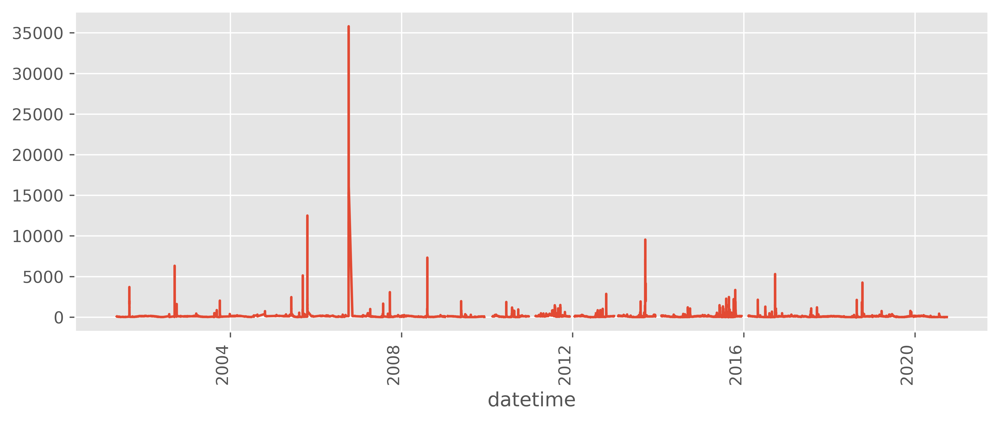

In [159]:
fig,ax=plt.subplots(dpi=600)
dd.cfs.plot(rot=90,figsize=(10,4))
plt.show()


## slicing ts

2018::
datetime
2018-01-01 00:00:00+00:00     98.5
2018-01-01 00:15:00+00:00     98.5
2018-01-01 00:30:00+00:00    102.0
2018-01-01 00:45:00+00:00     99.7
2018-01-01 01:00:00+00:00    101.0
2018-01-01 01:15:00+00:00     98.5
2018-01-01 01:30:00+00:00     98.5
2018-01-01 01:45:00+00:00    101.0
2018-01-01 02:00:00+00:00     99.7
2018-01-01 02:15:00+00:00    105.0
2018::
datetime
2018-03-01 00:15:00+00:00    101.0
2018-03-01 00:30:00+00:00    101.0
2018-03-01 00:45:00+00:00    101.0
2018-03-01 01:00:00+00:00    101.0
2018-03-01 01:15:00+00:00    103.0
2018-03-01 01:30:00+00:00    105.0
2018-03-01 01:45:00+00:00    107.0
2018-03-01 02:00:00+00:00    110.0
2018-03-01 02:15:00+00:00    105.0
2018-03-01 02:30:00+00:00    107.0


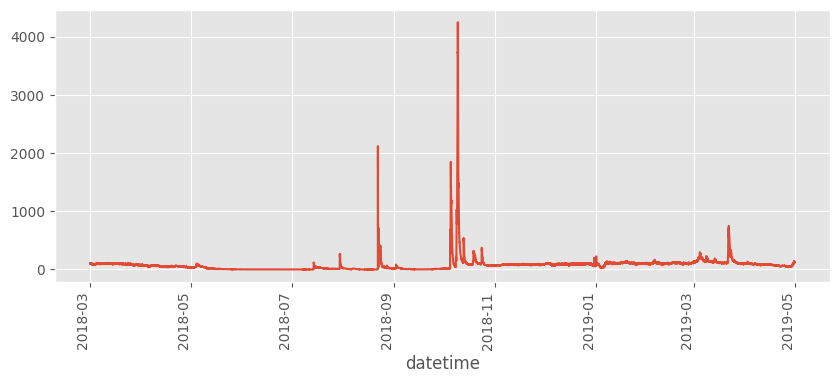

In [160]:
print(f"2018::\n{dd.cfs.loc['2018':].head(10).to_string()}")
print(f"2018::\n{dd.loc[((dd.index>'2018-03') & (dd.index<'2019-5')),'cfs'].head(10).to_string()}")

dd.loc[((dd.index>'2018-03') & (dd.index<'2019-5')),'cfs'].plot(rot=90,figsize=(10,4))
plt.show()

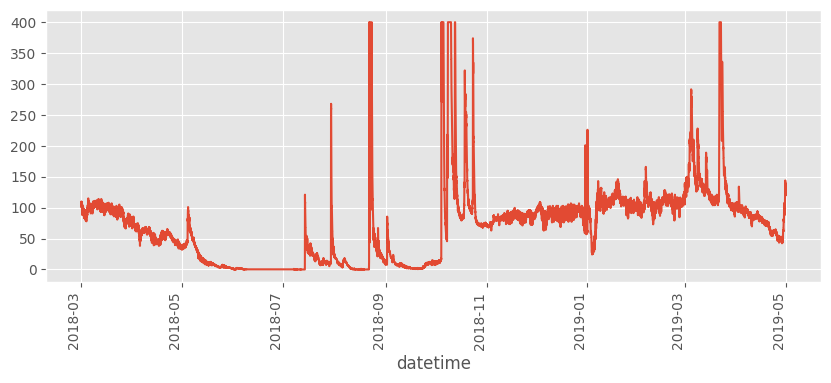

In [161]:
dd.loc[((dd.index>'2018-03') & (dd.index<'2019-5')),'cfs'].clip(upper=400).plot(rot=90,figsize=(10,4))
plt.show()

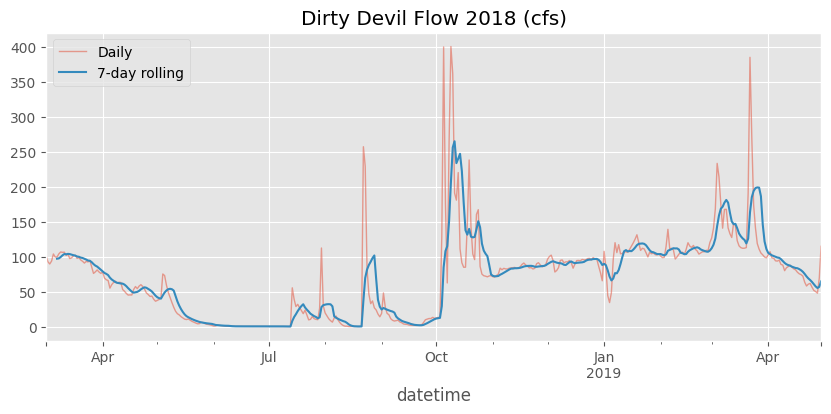

In [162]:
dd2018 = ( dd.loc[((dd.index>'2018-03') & (dd.index<'2019-5')),'cfs'].clip(upper=400 ))
dd2018.index = pd.to_datetime(dd2018.index)
ax = dd2018.resample('D').mean().plot(figsize=(10,4),alpha=.5,linewidth=1,label='Daily')
ax = dd2018.resample('D').mean().rolling(7).mean().plot(figsize=(10,4),ax=ax,label='7-day rolling')
ax.legend()
plt.title('Dirty Devil Flow 2018 (cfs)')
plt.show()


## missing ts data

In [163]:
dd['cfs'].isna().sum()

np.int64(46181)

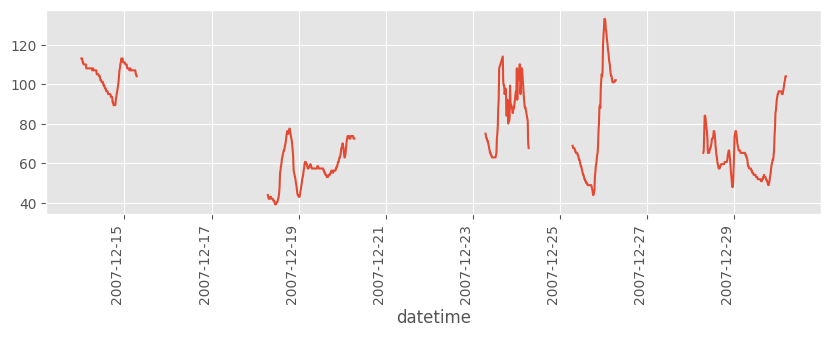

In [164]:
dd.loc[((dd.index>'2007-12-14 0:00') & (dd.index<'2007-12-30 04:45')),'cfs'].plot(figsize=(10,3),rot=90)
plt.show()

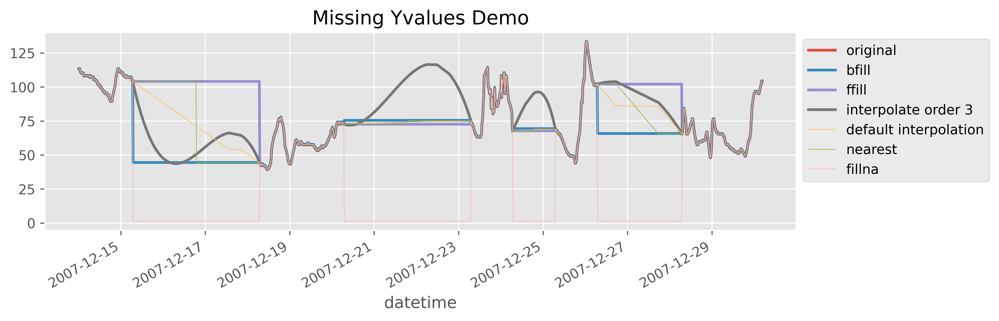

In [165]:
fig,ax = plt.subplots(dpi=600,figsize=(10,3))
dd_dec = dd.loc[((dd.index>'2007-12-14 0:00') & (dd.index<'2007-12-30 04:45')),'cfs']
dd_dec.plot(ax=ax,label='original',linewidth=2)
dd_dec.bfill().add(0.5).plot(label='bfill',ax=ax,linewidth=2)
dd_dec.ffill().add(0.1).plot(label='ffill',ax=ax,linewidth=2)
dd_dec.interpolate(method='polynomial',order=3).add(.15).plot(label='interpolate with 3rd order',ax=ax,linewidth=2)
dd_dec.interpolate().add(.2).plot(label='default interpolate',ax=ax,linewidth=.5)
dd_dec.interpolate(method='nearest').add(.25).plot(label='nearest',ax=ax,linewidth=.5)
dd_dec.fillna(1).add(.3).plot(label='fillna 1',ax=ax,linewidth=.5)
ax.legend(['original','bfill','ffill','interpolate order 3','default interpolation','nearest','fillna'],bbox_to_anchor=(1,1))
ax.set_title('Missing Yvalues Demo')
plt.show()


## exploring seasonality

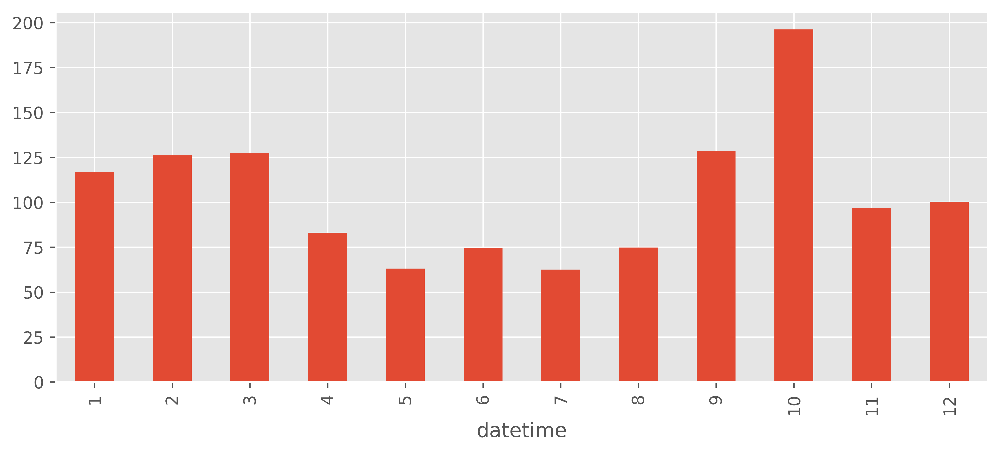

In [166]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
dd.groupby(pd.to_datetime(dd.index).month)['cfs'].describe()['mean'].plot.bar(ax=ax)
plt.show()

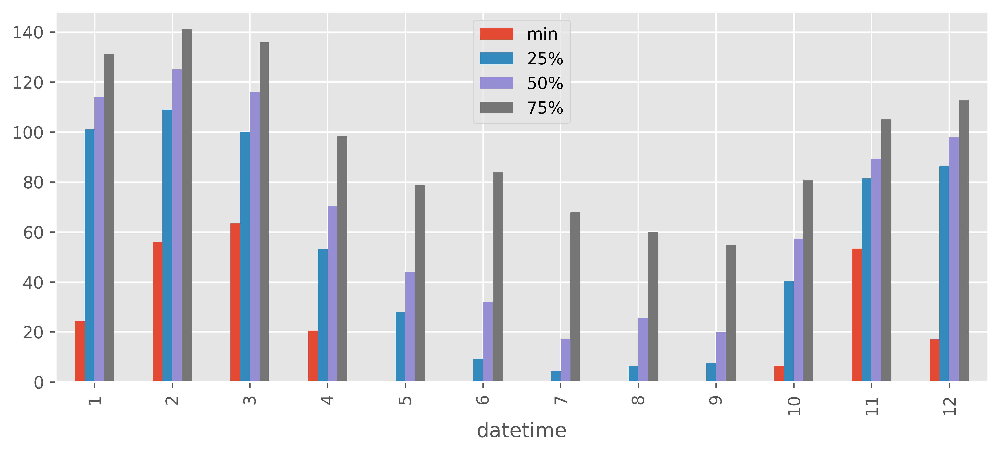

In [167]:
fig,ax= plt.subplots(dpi=600,figsize=(10,4))
dd.groupby(pd.to_datetime(dd.index).month)['cfs'].describe().loc[:,'min':'75%'].plot.bar(ax=ax)
plt.show()


## resampling data
## rules with offset aliases
## combining offset aliases
## anchored offset aliases
## resampling to finger-grain frequency
## grouping a date column with pd.Grouper

#  Joining Dataframes

can perform operations on dataframe that you do to database tables.
-`.merge`

## Adding rows to Dataframes

In [168]:
df1 = pd.DataFrame({ 
    'name': ['John' ,'George' ,'Ringo'] ,
    'color': ['Blue','Blue','Purple']
    })
df2 = pd.DataFrame({
    'name':['Paul','George','Ringo'],
    'carcolor':['Red','Blue',np.nan]
},index=[3,1,2])

In [169]:
print(f"concat::\n{pd.concat([df1,df2])}")

concat::
     name   color carcolor
0    John    Blue      NaN
1  George    Blue      NaN
2   Ringo  Purple      NaN
3    Paul     NaN      Red
1  George     NaN     Blue
2   Ringo     NaN      NaN


In [170]:
try:
    pd.concat([df1,df2],verify_integrity=True)
except ValueError as ve:
    print(ve.__repr__())

ValueError("Indexes have overlapping values: Index([1, 2], dtype='int64')")


## Adding cols to Dataframes


In [171]:
print(f"concat axis=1::{pd.concat([df1,df2],axis=1)}")

concat axis=1::     name   color    name carcolor
0    John    Blue     NaN      NaN
1  George    Blue  George     Blue
2   Ringo  Purple   Ringo      NaN
3     NaN     NaN    Paul      Red


## Joins


In [172]:
print(f"inner join ::\n{df1.merge(df2,how='inner',on='name')}")
print(f"left join ::\n{df1.merge(df2,how='left',on='name')}")
print(f"right join ::\n{df1.merge(df2,how='right',on='name')}")
print(f"outer join ::\n{df1.merge(df2,how='outer',on='name')}")


inner join ::
     name   color carcolor
0  George    Blue     Blue
1   Ringo  Purple      NaN
left join ::
     name   color carcolor
0    John    Blue      NaN
1  George    Blue     Blue
2   Ringo  Purple      NaN
right join ::
     name   color carcolor
0    Paul     NaN      Red
1  George    Blue     Blue
2   Ringo  Purple      NaN
outer join ::
     name   color carcolor
0  George    Blue     Blue
1    John    Blue      NaN
2    Paul     NaN      Red
3   Ringo  Purple      NaN


## joins indicators
`.merge(indicator=True)` pandas will create _merge columns

In [173]:
print(f"outer::\n{df1.merge(df2,how='outer',indicator=True)}")

outer::
     name   color carcolor      _merge
0  George    Blue     Blue        both
1    John    Blue      NaN   left_only
2    Paul     NaN      Red  right_only
3   Ringo  Purple      NaN        both


## merge validations
`.merge(validate=['1:m','1:1','m:1','m:m'],)` validates a constraint

## joining data


## validating joined data


## visualization of merged data


#  Exporting data

## create csv


In [174]:
# dd.to_csv('./assets/dritydevil_csv_export.csv')

## sql

In [175]:
# import urllib
# from sqlalchemy import create_engine

# params = urllib.parse.quote_plus("DRIVER={ODBC Driver 17 for SQL Server};"
#                         "SERVER=SERVER_NAME;"
#                         "DATABASE=DB_NAME;"
#                         "UID=DB_USERNAME;"
#                         "PWD=DB_PASSWORD")
# connection =  create_engine("mssql+pyodbc:///?odbc_connect={}".format(params))

# df.to_sql(dd,con=connection,if_exists='append',chunksize=6000,method='multi')


## json

In [176]:
jb3 = pd.read_json(jb2.to_json())
print(jb3.equals(jb2))   # Why?

False


/tmp/ipykernel_6337/22020023.py:1: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  jb3 = pd.read_json(jb2.to_json())


#  Debugging pandas


## Checking if Dataframe are Equal


In [177]:
df = pd.read_csv('./assets/dirtydevil.txt',skiprows=lambda x:x<34 or x==35,sep='\t')

def to_denver(df_:pd.DataFrame, timeC_col:str,tz_col:str):
    return(
        df_.assign(**{tz_col:df_[tz_col].replace('MDT','MST7MDT')})
            .groupby(tz_col)[timeC_col].transform(
                lambda s: pd.to_datetime(s).dt.tz_localize(s.name,ambiguous=True).dt.tz_convert('America/Denver')
            )
    )

def tweak_river(df_:pd.DataFrame):
    return(
        df_.assign(datetime=to_denver(df_,'datetime','tz_cd'))
        .rename(columns={
            '144166_00060':'cfs',
            '144167_00065':'gage_height'
        })
    )

dd = tweak_river(df)

/tmp/ipykernel_6337/1309676459.py:1: DtypeWarning: Columns (7) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('./assets/dirtydevil.txt',skiprows=lambda x:x<34 or x==35,sep='\t')


In [178]:
dd2 = pd.read_json(dd.to_json())
print(f"{dd.equals(dd2)}")

print(dd.ne(dd2).mean().multiply(100))

/tmp/ipykernel_6337/2556705807.py:1: FutureWarning: Passing literal json to 'read_json' is deprecated and will be removed in a future version. To read from a literal string, wrap it in a 'StringIO' object.
  dd2 = pd.read_json(dd.to_json())


False
agency_cd            0.000000
site_no              0.000000
datetime           100.000000
tz_cd                0.000000
cfs                  8.909244
144166_00060_cd      8.563058
gage_height         23.299617
144167_00065_cd     19.641576
dtype: float64


In [179]:
try:
    pd.testing.assert_frame_equal(dd,dd2)
except AssertionError as ae:
    print(ae.__repr__())

AssertionError('Attributes of DataFrame.iloc[:, 2] (column name="datetime") are different\n\nAttribute "dtype" are different\n[left]:  datetime64[ns, America/Denver]\n[right]: datetime64[ns]')


In [180]:
try:
    pd.testing.assert_frame_equal(
        dd,(dd2.assign(datetime=dd2.datetime.dt.tz_localize('UTC').dt.tz_convert('America/Denver'))),check_exact=True
        )
except AssertionError as ae:
    print(ae.__repr__())


AssertionError('DataFrame.iloc[:, 4] (column name="cfs") are different\n\nDataFrame.iloc[:, 4] (column name="cfs") values are different (0.34619 %)\n[index]: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, ...]\n[left]:  [71.0, 71.0, 71.0, 70.0, 70.0, 69.0, 70.0, 70.0, 70.0, 70.0, 69.0, 67.0, 67.0, 66.0, 66.0, 65.0, 66.0, 66.0, 66.0, 65.0, 64.0, 64.0, 64.0, 64.0, 64.0, 65.0, 64.0, 64.0, 64.0, 64.0, 63.0, 64.0, 63.0, 63.0, 65.0, 65.0, 66.0, 66.0, 66.0, 67.0, 68.0, 68.0, 69.0, 69.0, 70.0, 71.0, 72.0, 75.0, 76.0, 75.0, 75.0, 75.0, 76.0, 77.0, 78.0, 78.0, 78.0, 78.0, 78.0, 77.0, 78.0, 78.0, 77.0, 75.0, 73.0, 73.0, 73.0, 75.0, 76.0, 76.0, 76.0, 75.0, 75.

In [181]:
print(f"why not equal::\n{dd[dd.cfs.ne(dd2.cfs)].sample(10).to_string()}")
print(f"sample one record ::\n{dd.loc[96246].cfs,dd2.loc[96246].cfs}")

why not equal::
       agency_cd  site_no                  datetime tz_cd   cfs 144166_00060_cd  gage_height 144167_00065_cd
538052      USGS  9333500 2020-09-15 08:30:00-06:00   MDT  5.81               P         6.03               P
112627      USGS  9333500 2008-01-30 05:30:00-07:00   MST   NaN             NaN         3.84               A
227108      USGS  9333500 2011-06-22 13:00:00-06:00   MDT   NaN             NaN         4.90               A
245861      USGS  9333500 2012-01-11 16:30:00-07:00   MST   NaN             NaN         3.93               A
348040      USGS  9333500 2014-12-29 06:00:00-07:00   MST   NaN             NaN         5.89               A
312218      USGS  9333500 2013-12-12 21:15:00-07:00   MST   NaN             NaN         6.10               A
247078      USGS  9333500 2012-01-24 21:45:00-07:00   MST   NaN             NaN         4.08               A
314587      USGS  9333500 2014-01-06 13:30:00-07:00   MST   NaN             NaN         6.00               A
315

In [182]:
pd.testing.assert_frame_equal(
    dd,
    (dd2.assign(datetime=dd2.datetime.dt.tz_localize('UTC').dt.tz_convert('America/Denver'))).round(2),
    check_exact=True
)

## Debugging Chains


In [183]:
from IPython.display import display,HTML
from IPython.core.debugger import set_trace

def show(df_:pd.DataFrame, rows=20,cols=20,title=None):
    if title:
        display(HTML(f'<h2><{title}/h2>'))
    with pd.option_context('display.min_rows',rows, 'display.max_columns',cols):
        display(df_)
    return df_

def print_shape(df_:pd.DataFrame):
    print(df_.shape)
    return df_

def get_var(df_:pd.DataFrame,var_name:str):
    globals()[var_name]=df_
    return df_

def err(*args):
    set_trace()

In [184]:
autos = pd.read_csv('./assets/vehicles.csv.zip')


def to_tz(df_:pd.DataFrame, time_col:str, tz_offset:str,tz_name:str):
    return(
        df_.groupby(tz_offset)[time_col].transform(
            lambda s:pd.to_datetime(s).dt.tz_localize(s.name,ambiguous=True).dt.tz_convert(tz_name)
        )
    )

def tweak_autos(autos:pd.DataFrame)->pd.DataFrame:
    cols:list = ['city08','comb08','highway08','cylinders','displ','drive','eng_dscr','fuelCost08','make','model','trany','range','createdOn','year']
    return(
        autos[cols].assign(
            cylinders = autos.cylinders.fillna(0).astype('int8'),
            displ     = autos.displ.fillna(0).astype('float16'),
            drive     = autos.drive.fillna('Other').astype('category'),
            automatic = autos.trany.str.contains("Auto"),
            speeds    = autos.trany.str.extract(r'(\d)+').fillna('20').astype('int8'),
            offset    = autos.createdOn.str.extract(r'\d\d:\d\d:\d\d ([A-Z]{3}?)').replace('EDT','EST5EDT'),
            str_date  = (autos.createdOn.str.slice(4,19)+' ' + autos.createdOn.str.slice(-4)),
            createdOn = lambda df_: to_tz(df_,time_col='str_date',tz_offset='offset',tz_name='America/New_York'),
            ffs       = autos.eng_dscr.str.contains('FFS')
        )
        # .pipe(show,rows=2,title='New Cols')
        # .pipe(print_shape)
        # .pipe(get_var,'new_cols')   # >> get intermediate df_ as 'new_cols'
        .astype({
            'highway08':'int8',
            'city08':'int16',
            'comb08':'int16',
            'fuelCost08':'int16',
            'range':'int16',
            'year':'int16',
            'make':'category'
        }).drop(columns=['trany','eng_dscr'])
    )

print(f"tweak auto ::n{tweak_autos(autos=autos).sample(10).to_string()}")

/tmp/ipykernel_6337/1938679397.py:1: DtypeWarning: Columns (68,70,71,72,73,74,76,79) have mixed types. Specify dtype option on import or set low_memory=False.
  autos = pd.read_csv('./assets/vehicles.csv.zip')


tweak auto ::n       city08  comb08  highway08  cylinders     displ                       drive  fuelCost08           make                 model  range                 createdOn  year automatic  speeds offset              str_date    ffs
37014      15      17         20          6  3.000000            Rear-Wheel Drive        2500          Mazda                   MPV      0 2013-01-01 00:00:00-05:00  1989      True       4    EST  Jan 01 00:00:00 2013   True
23773      25      28         33          4  1.599609           Front-Wheel Drive        1850           MINI  Cooper S Convertible      0 2013-01-01 00:00:00-05:00  2012      True       6    EST  Jan 01 00:00:00 2013  False
9171       20      23         28          4  2.199219           Front-Wheel Drive        1850      Chevrolet    Cavalier Dual-fuel      0 2013-01-01 00:00:00-05:00  2002      True       4    EST  Jan 01 00:00:00 2013    NaN
13060      15      18         23          8  5.000000            Rear-Wheel Drive        2

/workspaces/DSML/DSLessons/.venv/lib/python3.12/site-packages/pandas/io/formats/format.py:1458: RuntimeWarning: overflow encountered in cast
  has_large_values = (abs_vals > 1e6).any()


## Debugging Apply

## Memory Usage


## Timing Info


In [185]:
%%time
autos = tweak_autos(autos)

CPU times: user 209 ms, sys: 958 μs, total: 210 ms
Wall time: 209 ms


<h1 align='center'>Thank you!! 🤗🤗</h1>